In [1]:
# HIDE CODE


import re
import os
import sys
import collections
import numpy as np
import pandas as pd
import nibabel as nib
from pathlib import Path
from os.path import join as pjoin
from scipy import stats as sp_stats
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')


# GitHub
git_path = pjoin(os.environ['HOME'], 'Dropbox/git/Ca-fMRI/')
sys.path.insert(0, git_path)
from simulation.simulation import *
from utils.plotting import *
from utils.processing import *
from model.configuration import Config

In [152]:
def filter_islands(partition, atlas, node_labels, min_com_size: int = 3):
    coms_ctr = collections.Counter(partition.values())
    
    good_com_idxs = zip(*filter(lambda x: x[1] > min_com_size, coms_ctr.most_common()))
    good_com_idxs = sorted(tuple(good_com_idxs)[0])
    bad_com_idxs = [item for item in set(partition.values()) if item not in good_com_idxs]

    comm_dict = collections.defaultdict(list)
    for k, v in partition.items():
        comm_dict[v].append(k)
    comm_dict = dict(sorted(comm_dict.items()))

    comm_mat = np.ones(atlas.shape) * -1
    for node, com_idx in partition.items():
        region_id = node_labels[node]
        if com_idx in good_com_idxs:
            comm_mat[atlas == region_id] = good_com_idxs.index(com_idx)
        else:
            comm_mat[atlas == region_id] = np.nan
    
    output = {
        'good_com_idxs': good_com_idxs,
        'bad_com_idxs': bad_com_idxs,
        'comm_dict': comm_dict,
        'comm_mat': comm_mat,
    }
    return output


def plot_louvain_communities(
    pearson: dict,
    spearman: dict,
    atlas: np.ndarray,
    modularities: dict,
    selected_idxs: list,
    pearson_th: float = 0.8,
    spearman_th: float = 0.7,
    figsize=(12, 4.5),
    colorbar=False, ):

    x0, y0 = tuple(zip(*modularities.items()))
    best_idx = np.argmax(y0)
    best_res = x0[best_idx]
    
    sns.set_style('white')
    plot_idxs = sorted(selected_idxs + [best_idx])
    fig, axes = plt.subplots(2, len(plot_idxs), figsize=figsize)

    for ii, idx in enumerate(plot_idxs):
        # pearson
        g = nx.from_numpy_matrix(pearson[pearson_th])
        coms = cdlib_algorithms.louvain(
            g_original=g,
            weight='weight',
            resolution=x0[idx],
            randomize=False,
        )
        partition = convert('community', 'partition', community=coms.communities)
        output = filter_islands(partition, atlas, node_labels, min_com_size=3)
        q = nx_comm.modularity(g, communities=coms.communities)

        im = axes[0, ii].imshow(output['comm_mat'], cmap='Spectral_r', interpolation='none')
        if colorbar:
            plt.colorbar(im, ax=axes[0, ii], shrink=0.7)
        msg = 'Q = {:.3f},  # com = {:d}'
        msg = msg.format(q, len(np.unique(output['comm_mat'][output['comm_mat']>-1])))
        axes[0, ii].set_title(msg, y=1.03)
        
        # spearman
        g = nx.from_numpy_matrix(spearman[spearman_th])
        coms = cdlib_algorithms.louvain(
            g_original=g,
            weight='weight',
            resolution=x0[idx],
            randomize=False,
        )
        partition = convert('community', 'partition', community=coms.communities)
        output = filter_islands(partition, atlas, node_labels, min_com_size=3)
        q = nx_comm.modularity(g, communities=coms.communities)
    
        im = axes[1, ii].imshow(output['comm_mat'], cmap='RdYlBu_r', interpolation='none')
        if colorbar:
            plt.colorbar(im, ax=axes[1, ii], shrink=0.7)
        msg = 'res = {:.3f}\n\nQ = {:.3f},  # com = {:d}'
        msg = msg.format(x0[idx], q, len(np.unique(output['comm_mat'][output['comm_mat']>-1])))
        axes[1, ii].set_title(msg, y=1.03)
        

        if ii == 0:
            axes[0, ii].set_ylabel('pearson\n(th = {:.2f})\n'.format(pearson_th), fontsize=12)
            axes[1, ii].set_ylabel('spearman\n(th = {:.2f})\n'.format(spearman_th), fontsize=12)
            
        for j in range(2):
            axes[j, ii].set_xticks([])
            axes[j, ii].set_yticks([])

    fig.tight_layout()
    plt.show()
    
    return fig, axes

### Load data

In [3]:
config = Config()

load = load_organized_data(
    folder='atlas-64_unfiltered_unnormalized',#'filtered_low-0.001_high-4.000_ord-2_normalized',
    config=config,
    subject=6,
    session=1,
    run=1,
)
load.keys()

dict_keys(['ca', 'atlas', 'ref', 'mask', 'atlas_kmeans', 'kmeans_centers', 'file_name'])

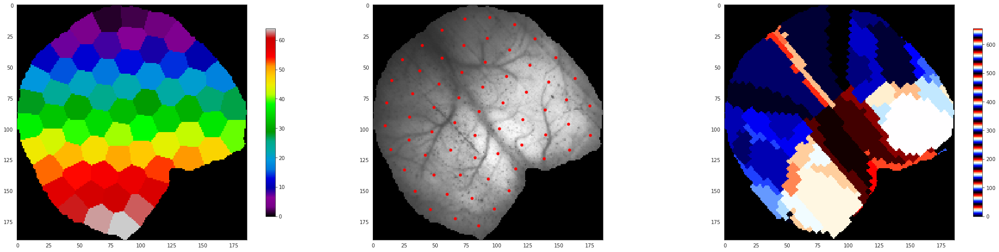

In [4]:
plt.figure(figsize=(30, 7))
plt.subplot(131)
plt.imshow(load['atlas_kmeans'], cmap='nipy_spectral', interpolation='none')
plt.colorbar(shrink=0.8)

plt.subplot(132)
plt.imshow(load['ref'], cmap='Greys_r', interpolation='none')
for j, i in load['kmeans_centers']: 
    plt.plot(i, j, marker='o', color='r', markersize=5)
    
plt.subplot(133)
plt.imshow(load['atlas'], cmap='flag_r', interpolation='none')
plt.colorbar(shrink=0.8)

plt.tight_layout()
# plt.savefig('kmeans_atlas.png', dpi=300)
plt.show()

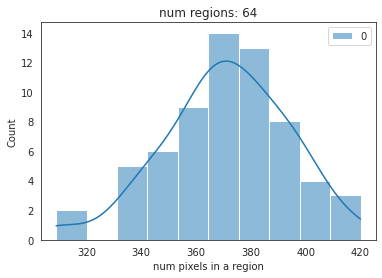

In [5]:
num_regions = max(np.unique(load['atlas_kmeans']))
num_pixs_per_roi = {k: len(np.where(load['atlas_kmeans'] == k)[0]) for k in range(1, num_regions+1)}

_ = sns.histplot(num_pixs_per_roi.values(), kde=True, bins=10)
plt.title('num regions: {:d}'.format(num_regions))
plt.xlabel('num pixels in a region')
plt.show()

In [6]:
x = np.zeros(load['atlas_kmeans'].shape + (list(load['ca'].values())[0].shape[-1],))

for key, data in load['ca'].items():
    
    num_nan = np.isnan(load['ca'][key]).mean().sum()
    if num_nan > 0:
        print(key, num_nan)
        continue
    
    x[load['atlas_kmeans'] == key] = load['ca'][key]

x.shape

(190, 186, 5500)

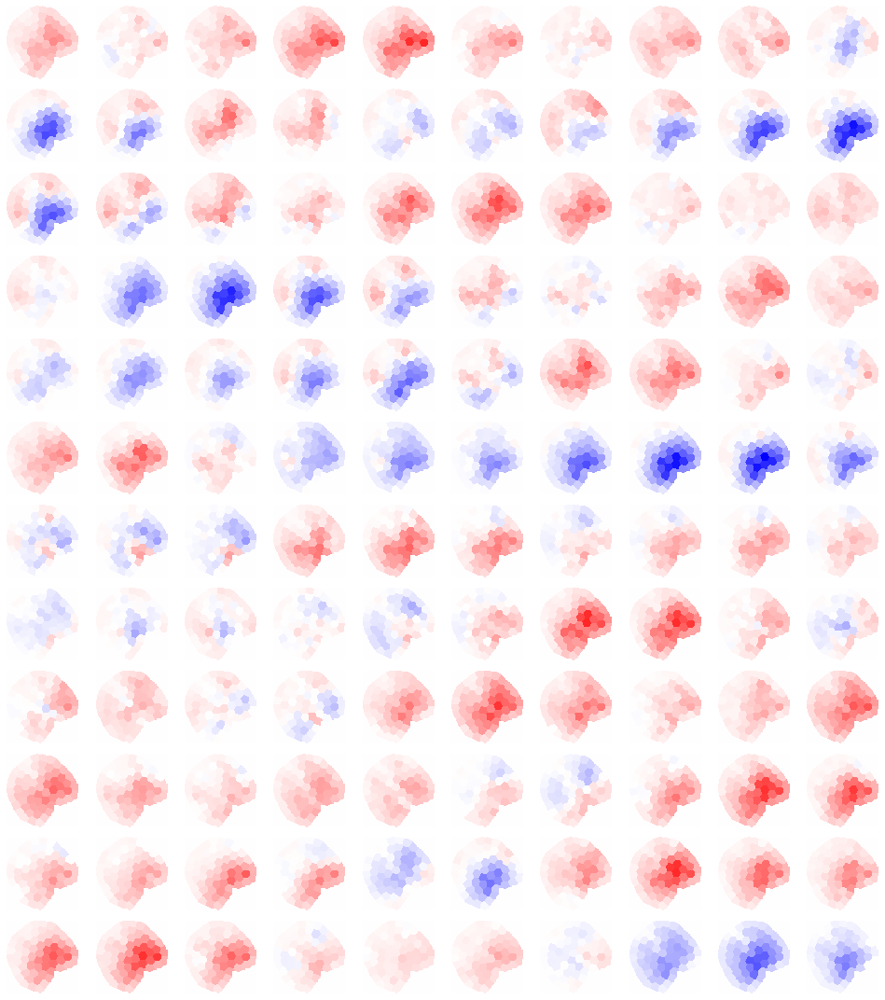

In [7]:
t = 1800
res = 1

_slice = x[..., t: t + res * 120]
vminmax = np.max(np.abs(_slice))

sns.set_style('white')
nrows, ncols = 12, 10
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 15))

for idx in range(_slice.shape[-1] // res):
    i, j = idx//ncols, idx%ncols
    axes[i, j].imshow(_slice[..., idx * res], vmin=-vminmax, vmax=vminmax, cmap='bwr', interpolation='none')
    axes[i, j].axis('off')
    
fig.tight_layout()
plt.show()

In [8]:
df = pd.DataFrame.from_dict(load['ca'])
node_labels = df.columns.values.tolist()
node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

df.describe()

,1,2,3,4,5,6,7,8,9,10,...,55,56,57,58,59,60,61,62,63,64
count,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,...,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000,5500.000000
mean,8.220594,10.124248,15.034250,6.969628,17.044105,13.357854,6.497459,11.090709,21.173194,18.259820,...,22.123233,26.128471,10.736159,19.513757,14.947451,17.820791,9.485063,15.261226,10.043897,12.084008
std,27.121143,31.304852,41.860082,14.499889,60.249522,51.822411,10.833903,42.090334,85.319236,74.071770,...,117.898445,150.389381,37.717099,107.411174,84.717142,114.019217,35.886435,72.255902,55.356303,42.942090
min,-87.721245,-107.246559,-139.770491,-55.772785,-189.234563,-181.506035,-36.063888,-153.167702,-263.981409,-217.061803,...,-345.371132,-492.320324,-105.681839,-322.384564,-245.113290,-342.035546,-108.573831,-214.676619,-165.424433,-120.916012
25%,-8.693668,-10.032225,-12.242748,-1.227007,-22.738368,-19.780471,0.048693,-13.573963,-34.976604,-30.898511,...,-57.087448,-65.657050,-13.143469,-47.435103,-42.806067,-61.331070,-14.120381,-33.401682,-28.309800,-18.186438
50%,11.271709,11.817890,16.220909,8.697181,18.045251,19.373542,6.870322,17.220251,21.723419,18.539010,...,30.721276,51.724324,11.806106,38.524894,21.683746,34.192762,12.206589,24.965916,15.326576,16.770525
75%,26.997407,31.778222,43.051191,16.601593,57.301942,49.693927,13.454929,40.691540,79.851822,67.862504,...,104.195360,133.212233,36.385089,94.084055,76.854982,101.445738,35.487019,66.716823,50.779558,43.000844
max,94.673654,109.183853,169.818004,55.591359,215.579242,174.726620,46.424464,147.954006,324.269841,282.235511,...,461.399580,422.765423,138.272639,365.871480,263.197993,308.215484,115.056476,245.470028,161.853816,144.954251


In [9]:
thresholds = [0.82, 0.83, 0.84, 0.85, 0.86, 0.87]
corrs = get_corrs(df, thresholds=thresholds)

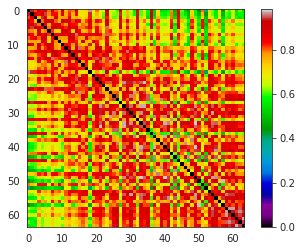

In [10]:
plt.imshow(corrs['pearson_corr'], cmap='nipy_spectral')
plt.colorbar()

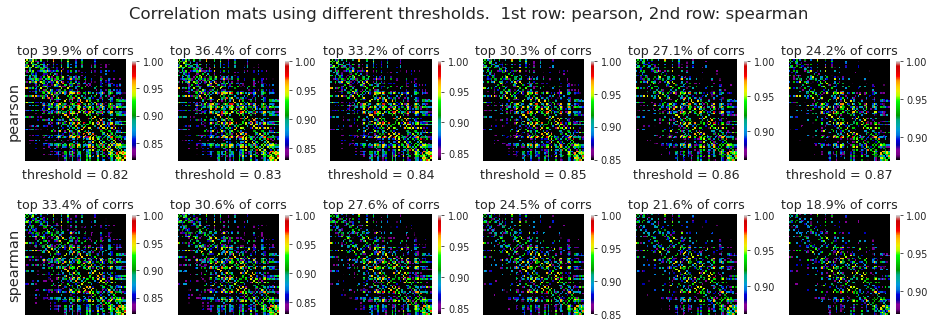

In [11]:
_ = plot_corrs(corrs['pearson'], corrs['spearman'])

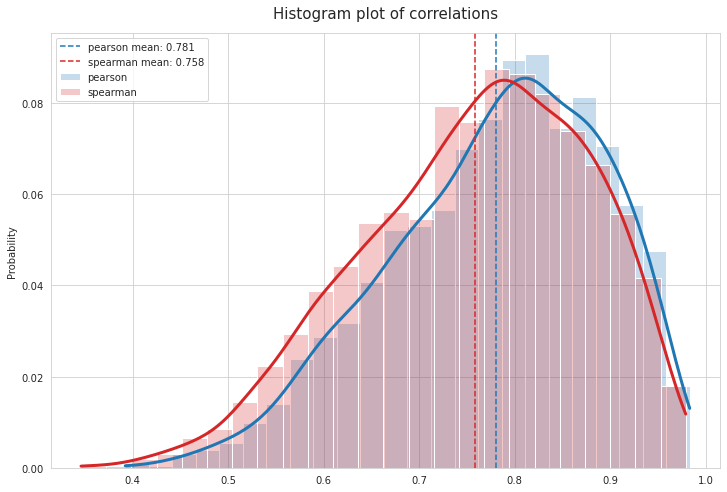

(<Figure size 864x576 with 1 Axes>,
 <AxesSubplot:title={'center':'Histogram plot of correlations'}, ylabel='Probability'>)

In [12]:
plot_corr_hist(
    corr_list=[corrs['pearson_corr'], corrs['spearman_corr']],
    labels=['pearson', 'spearman'],
    colors=['C0', 'C3'],
)

In [13]:
graphs = {th: nx.from_numpy_matrix(a) for th, a in corrs['spearman'].items()}

In [14]:
results_louvain = run_louvain(graphs[0.87], res=np.logspace(-1, 1, 1001))

  0%|          | 0/1001 [00:00<?, ?it/s]

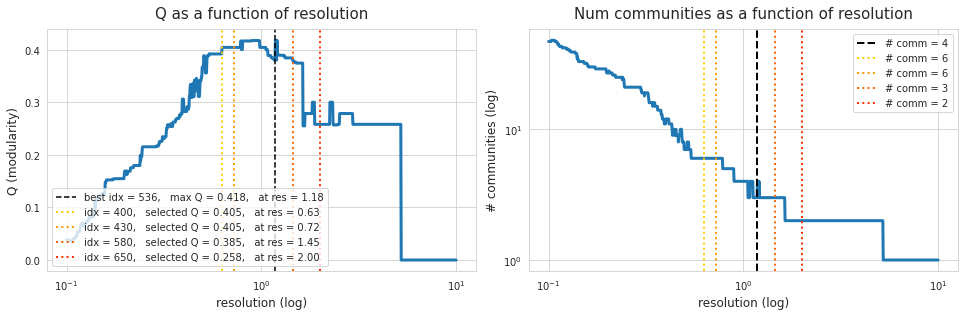

In [15]:
selected_idxs = [400, 430, 580, 650]
plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

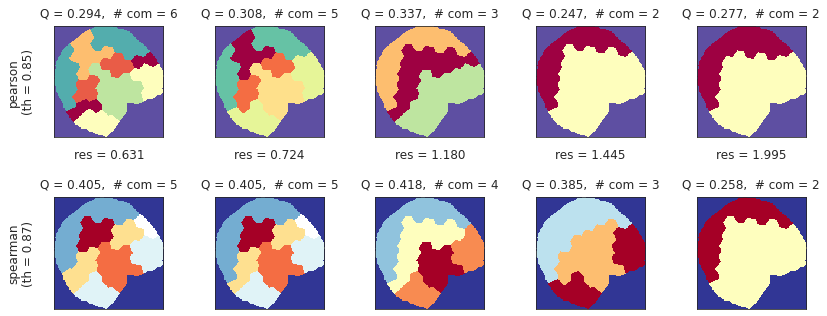

In [16]:
plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    pearson_th=0.85,
    spearman_th=0.87,
    figsize=(12, 4.5),
    colorbar=False, )

### Concanenate

In [19]:
data_all = {}
for run in [1, 3, 5, 7]:
    data_all[run] = load_organized_data(
        folder='atlas-64_unfiltered_unnormalized',#'filtered_low-0.001_high-4.000_ord-2_normalized',
        config=config,
        subject=6,
        session=1,
        run=run,
    )

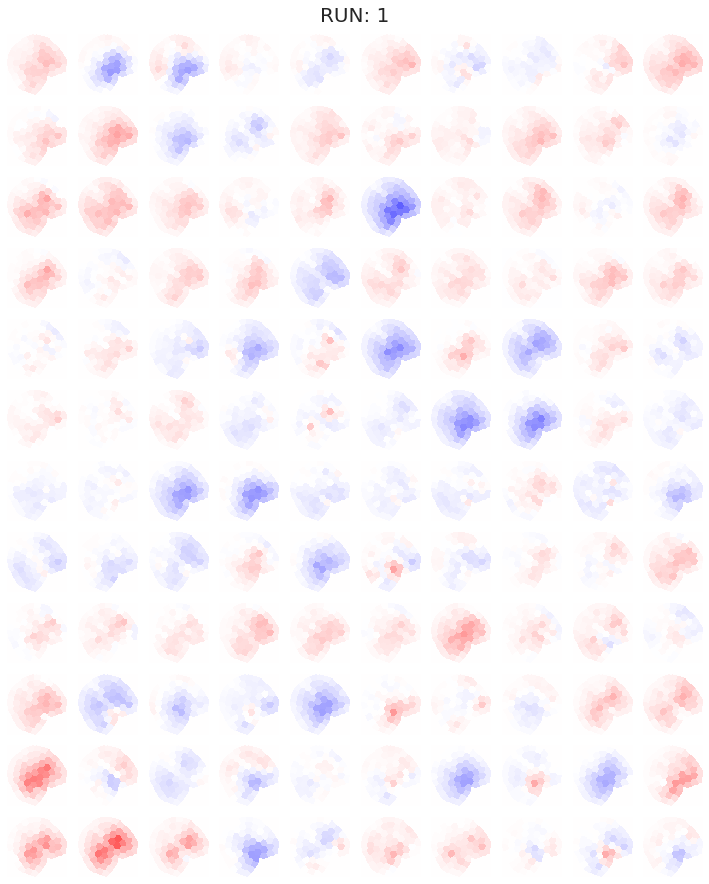

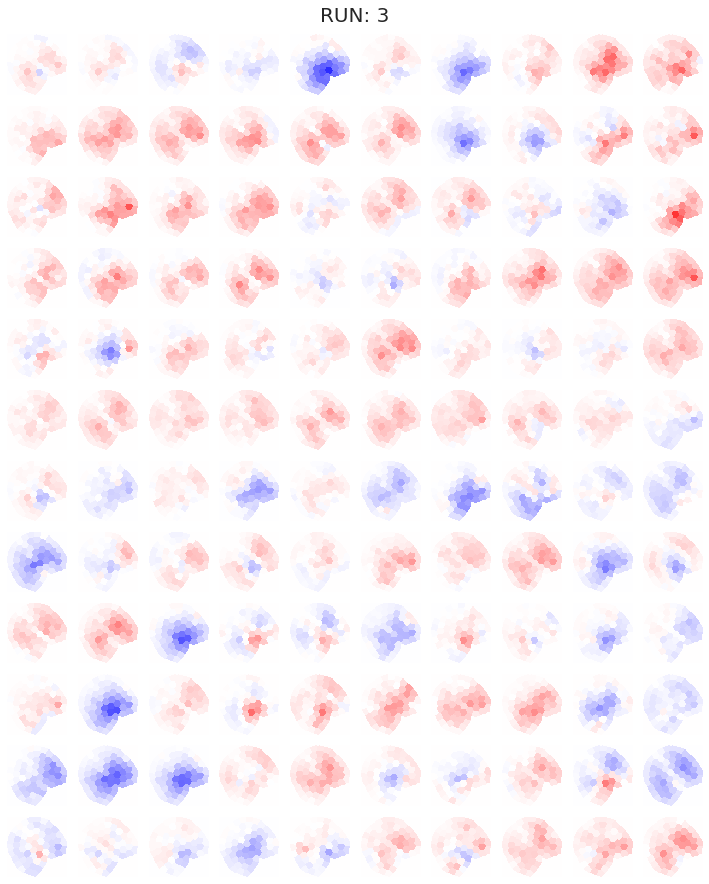

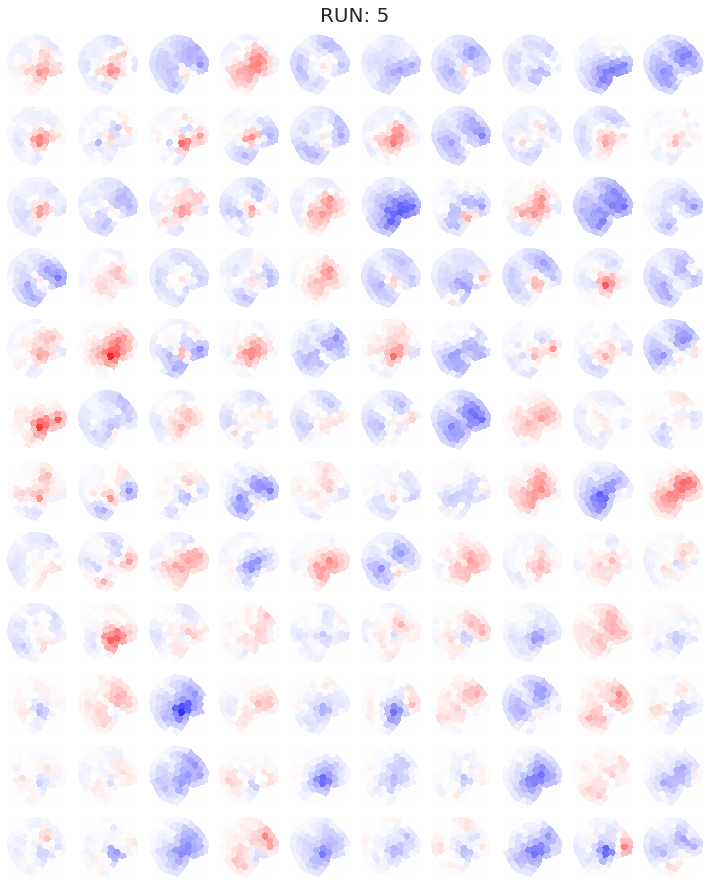

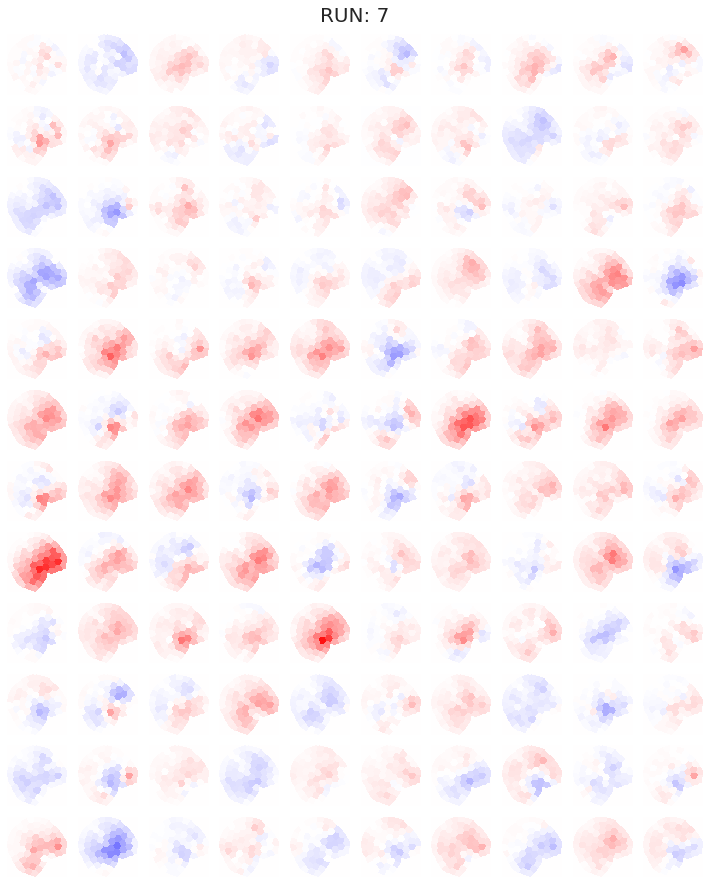

In [20]:
for run in [1, 3, 5, 7]:
    x = np.zeros(data_all[run]['atlas_kmeans'].shape + (list(data_all[run]['ca'].values())[0].shape[-1],))

    for key, time_series in data_all[run]['ca'].items():
        num_nan = np.isnan(time_series).sum()
        if num_nan > 0:
            print(key, num_nan)
            continue

        x[data_all[run]['atlas_kmeans'] == key] = data_all[run]['ca'][key]
    
    t = 1800
    res = 10

    _slice = x[..., t: t + res * 120]
    vminmax = np.max(np.abs(_slice))

    sns.set_style('white')
    nrows, ncols = 12, 10
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 12))

    for idx in range(_slice.shape[-1] // res):
        i, j = idx//ncols, idx%ncols
        axes[i, j].imshow(_slice[..., idx * res], vmin=-vminmax, vmax=vminmax, cmap='bwr', interpolation='none')
        axes[i, j].axis('off')

    fig.tight_layout()
    fig.suptitle('RUN: {:d}'.format(run), fontsize=20, y=1.02)
    plt.show()
    
    print('\n\n')

In [21]:
df = pd.DataFrame()

for run, load in data_all.items():
    x_dict = data_all[run]['ca'].copy()
    x = np.concatenate([item.reshape(1, -1) for item in x_dict.values()])
    mean, std = x.mean(), x.std()
    x_dict_normalized = {k: (v - mean) / std for k, v in x_dict.items()}
    df = pd.concat([df, pd.DataFrame.from_dict(x_dict_normalized)])

node_labels = df.columns.values.tolist()
node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

df.describe()

,1,2,3,4,5,6,7,8,9,10,...,55,56,57,58,59,60,61,62,63,64
count,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,...,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000
mean,-0.017091,-0.018094,-0.010540,-0.016550,-0.011512,-0.021764,-0.014284,-0.020678,-0.005548,-0.004293,...,-0.004632,0.006483,-0.018965,-0.005269,-0.024280,-0.028971,-0.022208,-0.030112,-0.032599,-0.023407
std,0.293107,0.329793,0.409712,0.183809,0.607682,0.496756,0.156783,0.413595,0.809006,0.775307,...,1.094276,1.456505,0.396140,1.103338,0.804792,1.068569,0.360039,0.710618,0.545087,0.438143
min,-1.043388,-1.230458,-1.548190,-0.727603,-2.207192,-1.955911,-0.536564,-1.679069,-2.761626,-2.656071,...,-3.694915,-5.579649,-1.316460,-3.964311,-2.668416,-3.693262,-1.266643,-2.490823,-1.937617,-1.560917
25%,-0.204398,-0.237450,-0.288074,-0.131086,-0.427558,-0.348917,-0.112429,-0.284800,-0.553923,-0.541385,...,-0.712163,-0.851620,-0.287821,-0.643192,-0.567234,-0.701505,-0.263425,-0.468468,-0.396361,-0.310415
50%,-0.015696,-0.016625,-0.018150,-0.021284,-0.027650,-0.008582,-0.016111,-0.018778,-0.023788,-0.026083,...,0.005326,0.077489,-0.029315,0.052105,-0.022706,0.005945,-0.024245,-0.011162,-0.029840,-0.025117
75%,0.167288,0.197051,0.256779,0.090474,0.387203,0.309958,0.077317,0.246454,0.527118,0.501101,...,0.704102,0.963066,0.233852,0.678673,0.514553,0.678639,0.213125,0.418685,0.320233,0.250817
max,1.491513,1.527203,1.912247,1.080039,2.975869,2.539781,1.154267,2.491389,4.078337,4.290311,...,7.007252,8.889001,2.064036,8.874418,4.156767,6.279339,1.859919,5.511394,3.545875,2.883433


In [29]:
thresholds = [0.80, 0.82, 0.83, 0.84, 0.85, 0.87]
corrs = get_corrs(df, thresholds=thresholds)

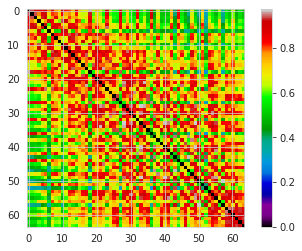

In [30]:
plt.imshow(corrs['pearson_corr'], cmap='nipy_spectral')
plt.colorbar()

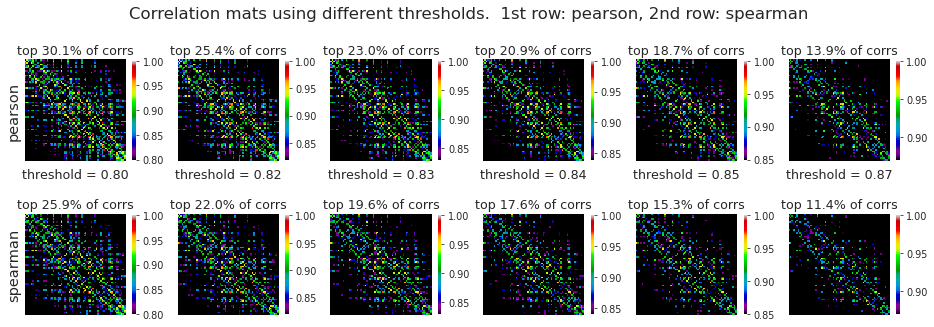

In [31]:
_ = plot_corrs(corrs['pearson'], corrs['spearman'])

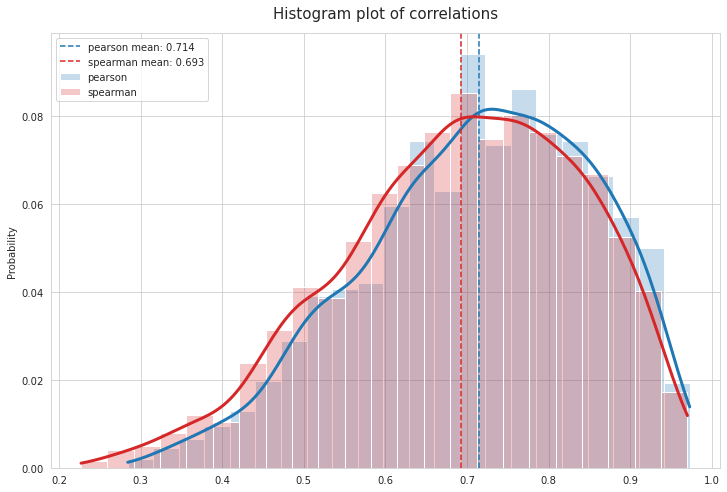

(<Figure size 864x576 with 1 Axes>,
 <AxesSubplot:title={'center':'Histogram plot of correlations'}, ylabel='Probability'>)

In [32]:
plot_corr_hist(
    corr_list=[corrs['pearson_corr'], corrs['spearman_corr']],
    labels=['pearson', 'spearman'],
    colors=['C0', 'C3'],
)

In [33]:
graphs = {th: nx.from_numpy_matrix(a) for th, a in corrs['spearman'].items()}

In [34]:
results_louvain = run_louvain(graphs[0.83], res=np.logspace(-1, 1, 1001))

  0%|          | 0/1001 [00:00<?, ?it/s]

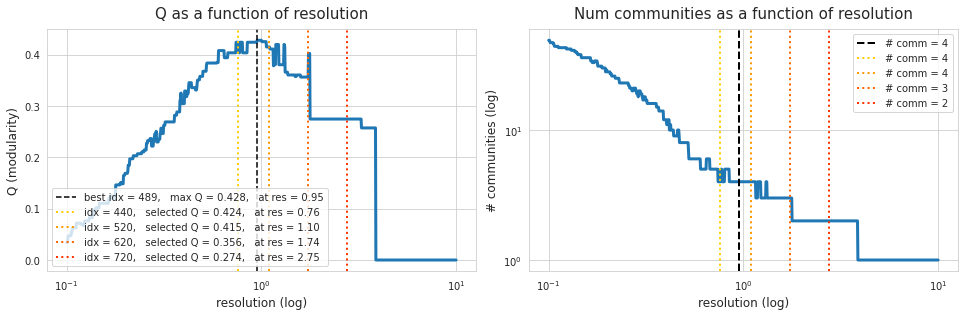

In [41]:
selected_idxs = [440, 520, 620, 720]
plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

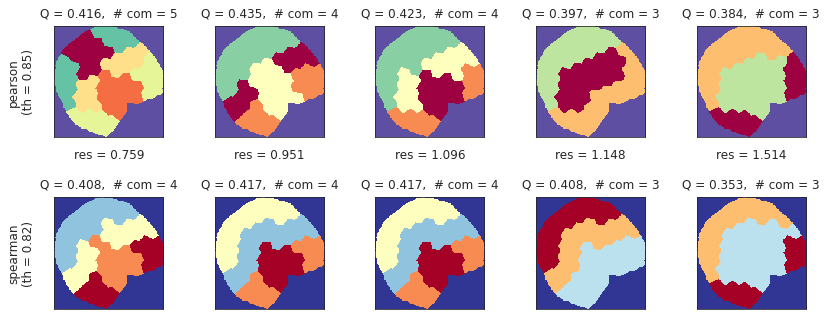

In [153]:
selected_idxs = [440, 520, 530, 590]

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    pearson_th=0.85,
    spearman_th=0.82,
    figsize=(12, 4.5),
    colorbar=False, )

In [154]:
fig.savefig('louvain.png', dpi=300)

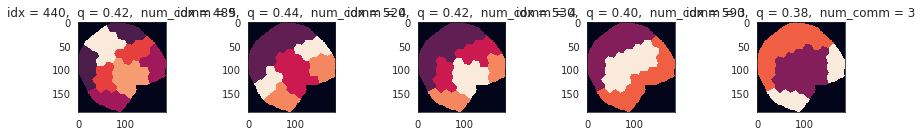

In [64]:
pearson_th = 0.85
selected_idxs = [440, 489, 520, 530, 590]
x0 = np.logspace(-1, 1, 1001)

plt.figure(figsize=(12, 2))
final_partition_cmaps = {}
for i, idx in enumerate(selected_idxs):
    g = nx.from_numpy_matrix(corrs['pearson'][pearson_th])
    coms = cdlib_algorithms.louvain(
        g_original=g,
        weight='weight',
        resolution=x0[idx],
        randomize=False,
    )
    partition = convert('community', 'partition', community=coms.communities)
    output = filter_islands(partition, load['atlas_kmeans'], node_labels, min_com_size=3)
    q = nx_comm.modularity(g, communities=coms.communities)
    
    plt.subplot(1, len(selected_idxs), i + 1)
    plt.imshow(output['comm_mat'], interpolation='none')
    plt.title("idx = {:d},  q = {:.2f},  num_comm = {:d}".format(idx, q, len(set(partition.values()))))
    
    num_comm = len(set(partition.values()))
    final_partition_cmaps[i] = {
        node_labels[node]: comm_idx / num_comm
        for node, comm_idx in partition.items()
    }

plt.tight_layout()
plt.show()

In [68]:
config = Config()

load = load_organized_data(
    folder='atlas-64_unfiltered_unnormalized',#'filtered_low-0.001_high-4.000_ord-2_normalized',
    config=config,
    subject=6,
    session=1,
    run=1,
)
load.keys()

dict_keys(['ca', 'atlas', 'ref', 'mask', 'atlas_kmeans', 'kmeans_centers', 'file_name'])

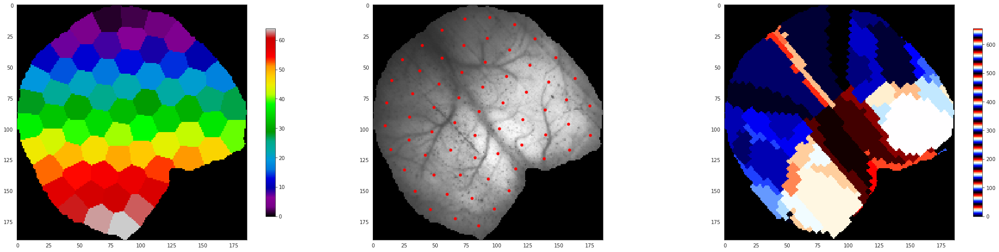

In [151]:
plt.figure(figsize=(30, 7))
plt.subplot(131)
plt.imshow(load['atlas_kmeans'], cmap='nipy_spectral', interpolation='none')
plt.colorbar(shrink=0.8)

plt.subplot(132)
plt.imshow(load['ref'], cmap='Greys_r', interpolation='none')
for j, i in load['kmeans_centers']: 
    plt.plot(i, j, marker='o', color='r', markersize=5)
    
plt.subplot(133)
plt.imshow(load['atlas'], cmap='flag_r', interpolation='none')
plt.colorbar(shrink=0.8)

plt.tight_layout()
plt.savefig('kmeans_atlas.png', dpi=300)
plt.show()

In [70]:
num_regions = max(np.unique((load['atlas_kmeans'])))
num_regions

64

In [71]:
mapping_degenerate = {}
for ii in range(1, num_regions+1):
    region_ids = load['atlas'][load['atlas_kmeans'] == ii]
    region_ids = [item for item in region_ids if item != 0]
    selected_target = collections.Counter(region_ids).most_common()[0][0]
    mapping_degenerate[ii] = selected_target

targets_counter = dict(collections.Counter(mapping_degenerate.values()))

#_counters = {ii: targets_counter[mapping_degenerate[ii]] for ii in mapping_degenerate}
_counters = {region_id: 0 for region_id in set(mapping_degenerate.values())}
mapping = {}
for ii, region_id in mapping_degenerate.items():
    mapping[ii] = '{:s}_{:d}'.format(config.labels[region_id], _counters[region_id])
    _counters[region_id] += 1

In [72]:
mapping

{1: 'R-Secondary motor area (MOs,993)_0',
 2: 'R-Primary motor area (MOp,985)_0',
 3: 'R-Primary somatosensory area, mouth (SSp-m,345)_0',
 4: 'R-Secondary motor area (MOs,993)_1',
 5: 'R-Primary somatosensory area, nose (SSp-n,353)_0',
 6: 'R-Primary motor area (MOp,985)_1',
 7: 'L-Secondary motor area (MOs,993)_0',
 8: 'R-Secondary motor area (MOs,993)_2',
 9: 'R-Primary somatosensory area, upper limb (SSp-ul,369)_0',
 10: 'R-Primary somatosensory area, barrel field (SSp-bfd,329)_0',
 11: 'L-Secondary motor area (MOs,993)_1',
 12: 'R-Anterior cingulate area, dorsal part (ACAd,39)_0',
 13: 'R-Primary motor area (MOp,985)_2',
 14: 'R-Primary somatosensory area, barrel field (SSp-bfd,329)_1',
 15: 'L-Secondary motor area (MOs,993)_2',
 16: 'R-Secondary motor area (MOs,993)_3',
 17: 'R-Anterolateral visual area (VISal,402)_0',
 18: 'R-Primary somatosensory area, lower limb (SSp-ll,337)_0',
 19: 'L-Secondary motor area (MOs,993)_3',
 20: 'R-Primary somatosensory area, barrel field (SSp-bf

In [73]:
def extract_info(string):
    if 'R-' in string:
        hemisphere = 'R'
    else:
        hemisphere = 'L'

    name = string[2:]
    shortened_name = '(' + string.split('(')[-1]
    processed_name = shortened_name.replace('(', '').replace(')', '').replace(',', '\t')

    return hemisphere, name, shortened_name, processed_name

In [74]:
all_r = []
all_l = []
for string in mapping.values():
    hemisphere, name, shortened_name, processed_name = extract_info(string)
    if hemisphere == 'R':
        all_r.append(processed_name)
    else:
        all_l.append(processed_name)
        
all_regions = set(all_r).intersection(set(all_l))
all_regions = list(all_regions)

In [75]:
region_heads = set([item.split('\t')[0] for item in all_regions])
region_heads = list(region_heads)
region_heads

['VISpm',
 'SSp-m',
 'VISl',
 'VISp',
 'VISa',
 'SSp-ul',
 'MOp',
 'RSPagl',
 'SSp-bfd',
 'SSp-ll',
 'SSp-n',
 'MOs',
 'RSPd']

In [76]:
len(region_heads), len(all_regions)

(13, 28)

In [77]:
all_regions

['MOs\t993_1',
 'RSPd\t879_1',
 'VISp\t385_4',
 'RSPd\t879_2',
 'VISp\t385_0',
 'VISp\t385_2',
 'MOs\t993_2',
 'SSp-bfd\t329_0',
 'MOs\t993_4',
 'RSPd\t879_3',
 'MOs\t993_3',
 'VISa\t312782546_0',
 'SSp-ll\t337_0',
 'SSp-bfd\t329_2',
 'SSp-n\t353_0',
 'SSp-ul\t369_0',
 'MOp\t985_1',
 'SSp-bfd\t329_1',
 'RSPagl\t894_0',
 'VISl\t409_0',
 'MOs\t993_0',
 'VISpm\t533_0',
 'RSPd\t879_0',
 'SSp-m\t345_0',
 'VISp\t385_3',
 'MOp\t985_0',
 'VISp\t385_1',
 'MOp\t985_2']

In [78]:
r2i, i2r = {}, {}
for ii, string in mapping.items():
    processed_name = extract_info(string)[-1]
    if processed_name not in all_regions:
        continue
    else:
        r2i[processed_name] = ii

for region, ii in r2i.items():
    i2r[ii] = region

In [79]:
len(r2i), len(i2r)

(28, 28)

In [138]:
palette = sns.color_palette('nipy_spectral', n_colors=num_regions)
colors_list = list(palette)

colors_rgb = []
for color in colors_list:
    colors_rgb.append(tuple(int(np.round(x * 255)) for x in color))

In [145]:
delimiter = ' '
lines_map = []

for ii, long_name in mapping.items():
    hemisphere, name, shortened_name, processed_name = extract_info(long_name)
    if hemisphere == 'L':
        continue

    line = delimiter.join(
        [processed_name.split('\t')[0],
         processed_name.split('\t')[1],
         str(colors_rgb[ii-1][0]),
         str(colors_rgb[ii-1][1]),
         str(colors_rgb[ii-1][2]),
         str(final_partition_cmaps[0][ii]),
         str(final_partition_cmaps[1][ii]),
         str(final_partition_cmaps[2][ii]),
         str(final_partition_cmaps[3][ii]),
         str(final_partition_cmaps[4][ii]),]
    )
    line = line + '\n'
    lines_map.append(line)
lines_map = sorted(lines_map)

In [146]:
circos_dir = pjoin(os.environ['HOME'], 'Documents/workspaces/circos/circos-projects/mouse')

with open(pjoin(circos_dir, 'map.txt'), 'w') as f:
    for line in lines_map:
        f.write(line)

In [147]:
a = corrs['pearson_corr'].copy()
viz_th = 0.85
a[a < viz_th] = 0.

g = nx.from_numpy_matrix(a)

In [148]:
edge_type = 0

lines_links = []
for i, j, d in g.edges(data=True):
    long_name_i = mapping[node_labels[i]]
    long_name_j = mapping[node_labels[j]]
    
    hemisphere_i, name_i, shortened_name_i, processed_name_i = extract_info(long_name_i)
    hemisphere_j, name_j, shortened_name_j, processed_name_j = extract_info(long_name_j)
    
    line = delimiter.join(
        [hemisphere_i.lower(),
        processed_name_i.split('\t')[-1],
        hemisphere_j.lower(),
        processed_name_j.split('\t')[-1],
        str(edge_type),
        str(d['weight']),]
    )
    line = line + '\n'
    
    cond_i = any(map(lambda x: delimiter.join(processed_name_i.split('\t')) in x, lines_map))
    cond_j = any(map(lambda x: delimiter.join(processed_name_j.split('\t')) in x, lines_map))
    
    if cond_i and cond_j:
        lines_links.append(line)

In [149]:
len(lines_links)

306

In [150]:
circos_dir = pjoin(os.environ['HOME'], 'Documents/workspaces/circos/circos-projects/mouse')

with open(pjoin(circos_dir, 'map.links.txt'), 'w') as f:
    for line in lines_links:
        f.write(line)

In [450]:
mapping

{1: 'R-Secondary motor area (MOs,993)_0',
 2: 'R-Primary motor area (MOp,985)_0',
 3: 'R-Primary motor area (MOp,985)_1',
 4: 'R-Secondary motor area (MOs,993)_1',
 5: 'R-Primary somatosensory area, mouth (SSp-m,345)_0',
 6: 'R-Secondary motor area (MOs,993)_2',
 7: 'R-Primary somatosensory area, mouth (SSp-m,345)_1',
 8: 'R-Primary somatosensory area, mouth (SSp-m,345)_2',
 9: 'R-Secondary motor area (MOs,993)_3',
 10: 'R-Primary motor area (MOp,985)_2',
 11: 'R-Primary motor area (MOp,985)_3',
 12: 'R-Secondary motor area (MOs,993)_4',
 13: 'R-Secondary motor area (MOs,993)_5',
 14: 'R-Primary somatosensory area, nose (SSp-n,353)_0',
 15: 'R-Primary somatosensory area, upper limb (SSp-ul,369)_0',
 16: 'R-Secondary motor area (MOs,993)_6',
 17: 'R-Primary somatosensory area, upper limb (SSp-ul,369)_1',
 18: 'R-Secondary motor area (MOs,993)_7',
 19: 'R-Primary motor area (MOp,985)_4',
 20: 'R-Prelimbic area (PL,972)_0',
 21: 'R-Secondary motor area (MOs,993)_8',
 22: 'R-Primary somato

In [449]:
for region_head in region_heads:
    print(region_head)

SSs
MOs
AUDpo
RSPd
VISl
RSPagl
SSp-n
VISal
SSp-m
VISp
VISa
VISpm
SSp-bfd
AUDd
SSp-un
SSp-ll
SSp-ul
RSPv
VISam
MOp
SSp-tr
VISrl
SCsg


In [ ]:
    #line = "{:s}{:s}{:s}\t{:s}\t{:d}\t{:.4f}"
    #line = line.format(
        hemisphere_i.lower(),
        processed_name_i.split('\t')[-1],
        hemisphere_j.lower(),
        processed_name_j.split('\t')[-1],
        edge_type,
        d['weight']
    )

In [427]:
hemisphere_i

'L'

In [431]:
with open(pjoin(dirdir, 'map.links.txt'), 'r') as f:
    read_lines = f.readlines()

In [434]:
print(read_lines[3])

r SbCG/S r SupTGLp 1 0.45523726797073



In [413]:
mapping

{1: 'R-Secondary motor area (MOs,993)_0',
 2: 'R-Primary motor area (MOp,985)_0',
 3: 'R-Primary motor area (MOp,985)_1',
 4: 'R-Secondary motor area (MOs,993)_1',
 5: 'R-Primary somatosensory area, mouth (SSp-m,345)_0',
 6: 'R-Secondary motor area (MOs,993)_2',
 7: 'R-Primary somatosensory area, mouth (SSp-m,345)_1',
 8: 'R-Primary somatosensory area, mouth (SSp-m,345)_2',
 9: 'R-Secondary motor area (MOs,993)_3',
 10: 'R-Primary motor area (MOp,985)_2',
 11: 'R-Primary motor area (MOp,985)_3',
 12: 'R-Secondary motor area (MOs,993)_4',
 13: 'R-Secondary motor area (MOs,993)_5',
 14: 'R-Primary somatosensory area, nose (SSp-n,353)_0',
 15: 'R-Primary somatosensory area, upper limb (SSp-ul,369)_0',
 16: 'R-Secondary motor area (MOs,993)_6',
 17: 'R-Primary somatosensory area, upper limb (SSp-ul,369)_1',
 18: 'R-Secondary motor area (MOs,993)_7',
 19: 'R-Primary motor area (MOp,985)_4',
 20: 'R-Prelimbic area (PL,972)_0',
 21: 'R-Secondary motor area (MOs,993)_8',
 22: 'R-Primary somato

In [310]:
node_labels

{0: 1,
 1: 2,
 2: 3,
 3: 4,
 4: 5,
 5: 6,
 6: 7,
 7: 8,
 8: 9,
 9: 10,
 10: 11,
 11: 12,
 12: 13,
 13: 14,
 14: 15,
 15: 16,
 16: 17,
 17: 18,
 18: 19,
 19: 20,
 20: 21,
 21: 22,
 22: 23,
 23: 24,
 24: 25,
 25: 26,
 26: 27,
 27: 28,
 28: 29,
 29: 30,
 30: 31,
 31: 32,
 32: 33,
 33: 34,
 34: 35,
 35: 36,
 36: 37,
 37: 38,
 38: 39,
 39: 40,
 40: 41,
 41: 42,
 42: 43,
 43: 44,
 44: 45,
 45: 46,
 46: 47,
 47: 48,
 48: 49,
 49: 50,
 50: 51,
 51: 52,
 52: 53,
 53: 54,
 54: 55,
 55: 56,
 56: 57,
 57: 58,
 58: 59,
 59: 60,
 60: 61,
 61: 62,
 62: 63,
 63: 64,
 64: 65,
 65: 66,
 66: 67,
 67: 68,
 68: 69,
 69: 70,
 70: 71,
 71: 72,
 72: 73,
 73: 74,
 74: 75,
 75: 76,
 76: 77,
 77: 78,
 78: 79,
 79: 80,
 80: 81,
 81: 82,
 82: 83,
 83: 84,
 84: 85,
 85: 86,
 86: 87,
 87: 88,
 88: 89,
 89: 90,
 90: 91,
 91: 92,
 92: 93,
 93: 94,
 94: 95,
 95: 96,
 96: 97,
 97: 98,
 98: 99,
 99: 100,
 100: 101,
 101: 102,
 102: 103,
 103: 104,
 104: 105,
 105: 106,
 106: 107,
 107: 108,
 108: 109,
 109: 110,
 110: 11

EdgeDataView([(0, 1, {'weight': 0.9522887508551575}), (0, 2, {'weight': 0.9141374945403125}), (0, 3, {'weight': 0.9323559210031352}), (0, 4, {'weight': 0.8743224770428234}), (0, 5, {'weight': 0.8632879712226486}), (0, 6, {'weight': 0.8639696142918013}), (0, 7, {'weight': 0.8063035916331055}), (0, 8, {'weight': 0.913508646126936}), (0, 9, {'weight': 0.9028478190090281}), (0, 10, {'weight': 0.875691126408445}), (0, 11, {'weight': 0.7181618561791902}), (0, 12, {'weight': 0.8580515866564168}), (0, 13, {'weight': 0.7900766720508329}), (0, 14, {'weight': 0.8539859708626879}), (0, 15, {'weight': 0.7655476427192038}), (0, 16, {'weight': 0.7692272491425698}), (0, 17, {'weight': 0.8232512932156698}), (0, 18, {'weight': 0.8520960724120223}), (0, 19, {'weight': 0.6481542935575196}), (0, 20, {'weight': 0.8241099675959587}), (0, 21, {'weight': 0.7769263106682908}), (0, 22, {'weight': 0.7878759261777349}), (0, 23, {'weight': 0.8385152824280727}), (0, 24, {'weight': 0.765512976773227}), (0, 25, {'weig

0 1 1 2 0.9522887508551575
0 2 1 3 0.9141374945403125
0 3 1 4 0.9323559210031352
0 4 1 5 0.8743224770428234
0 5 1 6 0.8632879712226486
0 6 1 7 0.8639696142918013
0 7 1 8 0.8063035916331055
0 8 1 9 0.913508646126936
0 9 1 10 0.9028478190090281
0 10 1 11 0.875691126408445
0 11 1 12 0.7181618561791902
0 12 1 13 0.8580515866564168
0 13 1 14 0.7900766720508329
0 14 1 15 0.8539859708626879
0 15 1 16 0.7655476427192038
0 16 1 17 0.7692272491425698
0 17 1 18 0.8232512932156698
0 18 1 19 0.8520960724120223
0 19 1 20 0.6481542935575196
0 20 1 21 0.8241099675959587
0 21 1 22 0.7769263106682908
0 22 1 23 0.7878759261777349
0 23 1 24 0.8385152824280727
0 24 1 25 0.765512976773227
0 25 1 26 0.6748540708905372
0 26 1 27 0.78024973185961
0 27 1 28 0.7641718605196955
0 28 1 29 0.7697474894393823
0 29 1 30 0.7075545021044761
0 30 1 31 0.7602151992510016
0 31 1 32 0.7562708684508136
0 32 1 33 0.7772585543958287
0 33 1 34 0.779666874657586
0 34 1 35 0.6822357069570737
0 35 1 36 0.6400787545770246
0 36 1 3

2 128 3 129 0.47438706461466673
2 129 3 130 0.3865325557106162
2 130 3 131 0.48987216982754056
2 131 3 132 0.5153850347863894
2 132 3 133 0.466621589449213
2 133 3 134 0.5067870959125323
2 134 3 135 0.7991069180089156
2 135 3 136 0.5197195802718315
2 136 3 137 0.5073789035475834
2 137 3 138 0.7199802627446004
2 138 3 139 0.5295265476193126
2 139 3 140 0.6426248154564503
2 140 3 141 0.4406070309966373
2 141 3 142 0.8389238708610716
2 142 3 143 0.8429303796517745
2 143 3 144 0.4886347738857782
2 144 3 145 0.5815170617180302
2 145 3 146 0.43629652939797636
2 146 3 147 0.4417260862251309
2 147 3 148 0.4237315087341933
2 148 3 149 0.3628443244531902
2 149 3 150 0.6613994927408954
2 150 3 151 0.4756368954442662
2 151 3 152 0.377943637902714
2 152 3 153 0.4154532709061621
2 153 3 154 0.6046659123232019
2 154 3 155 0.5286108725526611
2 155 3 156 0.4466961844132259
2 156 3 157 0.44660747490047625
2 157 3 158 0.5439385569470736
2 158 3 159 0.5121481231544647
2 159 3 160 0.8140017721027087
2 160 

5 140 6 141 0.38584836008168355
5 141 6 142 0.7845772400015906
5 142 6 143 0.7471801197045416
5 143 6 144 0.5108332385870665
5 144 6 145 0.6148958804946495
5 145 6 146 0.46253654252439186
5 146 6 147 0.42462711760320665
5 147 6 148 0.4064506199806802
5 148 6 149 0.45286315157897683
5 149 6 150 0.5964549913408339
5 150 6 151 0.4675837290178689
5 151 6 152 0.39774200388388575
5 152 6 153 0.41430099919018054
5 153 6 154 0.5728865493285377
5 154 6 155 0.5403851195819009
5 155 6 156 0.3959951314037363
5 156 6 157 0.4410083795509134
5 157 6 158 0.5080993441768424
5 158 6 159 0.4557530265339905
5 159 6 160 0.7248031410644482
5 160 6 161 0.4963237451502117
5 161 6 162 0.6985620472137296
5 162 6 163 0.4345499661585575
5 163 6 164 0.5397399689261894
5 164 6 165 0.3785145216134185
5 165 6 166 0.5733309537269904
5 166 6 167 0.5057667285510377
5 167 6 168 0.3533427144607892
5 168 6 169 0.6906570208806238
5 169 6 170 0.4112835494528862
5 170 6 171 0.3654127102705875
5 171 6 172 0.3569116745911747
5 

7 181 8 182 0.5027968240405142
7 182 8 183 0.372930026034655
7 183 8 184 0.4528235970121526
7 184 8 185 0.48635240592027906
7 185 8 186 0.38195704681254994
7 186 8 187 0.35536871586532115
7 187 8 188 0.3582909633986858
7 188 8 189 0.4363771391536207
7 189 8 190 0.7348847789543633
7 190 8 191 0.6474399586289025
7 191 8 192 0.4939023746724038
7 192 8 193 0.515619192118942
7 193 8 194 0.4496615500922644
7 194 8 195 0.6380656048540294
7 195 8 196 0.7557252060351456
7 196 8 197 0.49618246659868614
7 197 8 198 0.34364417811952835
7 198 8 199 0.37864219393384213
7 199 8 200 0.45808037340605706
7 200 8 201 0.5334804246120188
7 201 8 202 0.4023815832549211
7 202 8 203 0.6616826164221412
7 203 8 204 0.307886700890395
7 204 8 205 0.35273677590409075
7 205 8 206 0.6635198303548775
7 206 8 207 0.5257989658998958
7 207 8 208 0.5145025085443775
7 208 8 209 0.3467121014216601
7 209 8 210 0.6068205601543158
7 210 8 211 0.5761789406203137
7 211 8 212 0.4271352396821814
7 212 8 213 0.5510623651469642
7 2

10 140 11 141 0.501440025981458
10 141 11 142 0.7913999224933785
10 142 11 143 0.850063925062563
10 143 11 144 0.5597998351016542
10 144 11 145 0.615353851198757
10 145 11 146 0.5205340667513785
10 146 11 147 0.45111977288289523
10 147 11 148 0.5044958746427212
10 148 11 149 0.39312098489274616
10 149 11 150 0.753277797314148
10 150 11 151 0.5347956186998795
10 151 11 152 0.43430034180188504
10 152 11 153 0.4826682322792339
10 153 11 154 0.691153304805792
10 154 11 155 0.5949675446725333
10 155 11 156 0.5421106602993697
10 156 11 157 0.5213373352534945
10 157 11 158 0.6426768210065957
10 158 11 159 0.562712120735447
10 159 11 160 0.8257412538767086
10 160 11 161 0.4726801724040714
10 161 11 162 0.8357421858317745
10 162 11 163 0.5320043539487544
10 163 11 164 0.5848628803711579
10 164 11 165 0.37392535251413395
10 165 11 166 0.5299214753373382
10 166 11 167 0.5072610675821285
10 167 11 168 0.3532231769132491
10 168 11 169 0.7745018543528464
10 169 11 170 0.45935610606180355
10 170 11 1

12 253 13 254 0.5447699937620488
12 254 13 255 0.5881196476453339
12 255 13 256 0.5689779638964084
13 14 14 15 0.9046161785603966
13 15 14 16 0.6536406499620183
13 16 14 17 0.8767243088473438
13 17 14 18 0.7926687638084138
13 18 14 19 0.8719832193007531
13 19 14 20 0.41947500808115074
13 20 14 21 0.7470484195246434
13 21 14 22 0.9030554321668929
13 22 14 23 0.8891891353391398
13 23 14 24 0.842634966635242
13 24 14 25 0.8397688172824244
13 25 14 26 0.5330296417610343
13 26 14 27 0.6828372690394451
13 27 14 28 0.8807355091154301
13 28 14 29 0.5481348239280788
13 29 14 30 0.7959367880326068
13 30 14 31 0.718071495803663
13 31 14 32 0.7449728743158452
13 32 14 33 0.8175979371547253
13 33 14 34 0.596875893545305
13 34 14 35 0.7542541939803235
13 35 14 36 0.7778728390972978
13 36 14 37 0.7112780551445934
13 37 14 38 0.6223894037230623
13 38 14 39 0.8254709976166646
13 39 14 40 0.5691950012401873
13 40 14 41 0.6357367905336216
13 41 14 42 0.6600445249848494
13 42 14 43 0.7638908387889707
13 4

15 171 16 172 0.42197740129470407
15 172 16 173 0.46496327137491467
15 173 16 174 0.6290952917381865
15 174 16 175 0.5729598474715484
15 175 16 176 0.5616744285877413
15 176 16 177 0.504534893037054
15 177 16 178 0.7397110276683666
15 178 16 179 0.586563443097716
15 179 16 180 0.46534927372333285
15 180 16 181 0.7174247732674476
15 181 16 182 0.6111135566799901
15 182 16 183 0.4020922413870925
15 183 16 184 0.5057158466898739
15 184 16 185 0.511553631083995
15 185 16 186 0.377362390501866
15 186 16 187 0.4677178938929202
15 187 16 188 0.3791645897387658
15 188 16 189 0.52337230461959
15 189 16 190 0.7129556329449604
15 190 16 191 0.6771243296346386
15 191 16 192 0.5768904169492205
15 192 16 193 0.5840472466192616
15 193 16 194 0.5149304302067538
15 194 16 195 0.6770443875783936
15 195 16 196 0.7500078092256611
15 196 16 197 0.5417787273637201
15 197 16 198 0.3678503141930128
15 198 16 199 0.39810344258417596
15 199 16 200 0.5252622878975863
15 200 16 201 0.6392441562318685
15 201 16 20

18 192 19 193 0.6340301478796116
18 193 19 194 0.4825557785336009
18 194 19 195 0.7582881589671886
18 195 19 196 0.7815401799109839
18 196 19 197 0.5770428229291358
18 197 19 198 0.3507497271708912
18 198 19 199 0.41914664508549215
18 199 19 200 0.5005909419057546
18 200 19 201 0.6857187748948063
18 201 19 202 0.5217927324001094
18 202 19 203 0.7620603312101792
18 203 19 204 0.3534614078550182
18 204 19 205 0.35710350893462783
18 205 19 206 0.74530342297667
18 206 19 207 0.6283137113699162
18 207 19 208 0.6305163605836279
18 208 19 209 0.35995690895013144
18 209 19 210 0.7195514683446848
18 210 19 211 0.6965417708331525
18 211 19 212 0.5047042780157895
18 212 19 213 0.6697143708899634
18 213 19 214 0.6221227030969533
18 214 19 215 0.2851566437577683
18 215 19 216 0.6843680795148481
18 216 19 217 0.57173129842304
18 217 19 218 0.6541309401517529
18 218 19 219 0.6434742733666879
18 219 19 220 0.604782143384407
18 220 19 221 0.3786080567344344
18 221 19 222 0.6328593138468783
18 222 19 22

21 39 22 40 0.5478379929503886
21 40 22 41 0.5625638493567153
21 41 22 42 0.6482278648525095
21 42 22 43 0.798305149101164
21 43 22 44 0.828348456572872
21 44 22 45 0.7690504946363762
21 45 22 46 0.7465953992878135
21 46 22 47 0.64470362132767
21 47 22 48 0.6016834533610577
21 48 22 49 0.7126951537316125
21 49 22 50 0.6738986606779171
21 50 22 51 0.8105284219271446
21 51 22 52 0.7167215488737873
21 52 22 53 0.7609815440316305
21 53 22 54 0.7964682292056456
21 54 22 55 0.736804380930423
21 55 22 56 0.7332790763934175
21 56 22 57 0.5918545026911108
21 57 22 58 0.7217057230335425
21 58 22 59 0.7075350149633153
21 59 22 60 0.7745915180340786
21 60 22 61 0.6747457373367466
21 61 22 62 0.7953556579262936
21 62 22 63 0.7105412736379236
21 63 22 64 0.667022426479211
21 64 22 65 0.7635308019610133
21 65 22 66 0.726732589335399
21 66 22 67 0.6845859162083561
21 67 22 68 0.6894952243064145
21 68 22 69 0.7555882520407874
21 69 22 70 0.7208774004804293
21 70 22 71 0.7103324879253754
21 71 22 72 0.7

24 114 25 115 0.6315509963556764
24 115 25 116 0.6004673006804792
24 116 25 117 0.713226599219976
24 117 25 118 0.587063850272406
24 118 25 119 0.8750229537987595
24 119 25 120 0.8383126592497401
24 120 25 121 0.6506297912562677
24 121 25 122 0.707249941693372
24 122 25 123 0.7600605598897191
24 123 25 124 0.8423245772697463
24 124 25 125 0.7973932286933112
24 125 25 126 0.6400468176686784
24 126 25 127 0.5894953544271111
24 127 25 128 0.5425510190375058
24 128 25 129 0.6193879747212618
24 129 25 130 0.5501134567874385
24 130 25 131 0.6141233950026017
24 131 25 132 0.6533250824629735
24 132 25 133 0.5770964015670537
24 133 25 134 0.6588908504479678
24 134 25 135 0.87447592367639
24 135 25 136 0.697560565302555
24 136 25 137 0.6675004924261191
24 137 25 138 0.8572036648903348
24 138 25 139 0.5725409338165798
24 139 25 140 0.8283395315424041
24 140 25 141 0.5094120581800158
24 141 25 142 0.732784909457955
24 142 25 143 0.84838280302774
24 143 25 144 0.6665115496180705
24 144 25 145 0.763

27 207 28 208 0.6248473407560113
27 208 28 209 0.4126801596540253
27 209 28 210 0.7414725792761983
27 210 28 211 0.7272891141725037
27 211 28 212 0.5042248054049141
27 212 28 213 0.6800895852317067
27 213 28 214 0.623146251991821
27 214 28 215 0.3768794396302815
27 215 28 216 0.7015760537918325
27 216 28 217 0.5666803261192236
27 217 28 218 0.6232498719195476
27 218 28 219 0.6522651467234738
27 219 28 220 0.6167541095514304
27 220 28 221 0.41828374923057354
27 221 28 222 0.6369268000890221
27 222 28 223 0.6109760855698976
27 223 28 224 0.6544103884762204
27 224 28 225 0.5140373606675102
27 225 28 226 0.3788287970322808
27 226 28 227 0.6061637845597877
27 227 28 228 0.5998495760517605
27 228 28 229 0.5739352990924482
27 229 28 230 0.5896312084224143
27 230 28 231 0.5919014225870087
27 231 28 232 0.49119334280690435
27 232 28 233 0.434816690367154
27 233 28 234 0.5698960157083337
27 234 28 235 0.610054057486983
27 235 28 236 0.5573536271569771
27 236 28 237 0.625764383040666
27 237 28 23

30 49 31 50 0.8704497246534447
30 50 31 51 0.7784092867608082
30 51 31 52 0.8533101761098857
30 52 31 53 0.7958861671234043
30 53 31 54 0.8332711855372664
30 54 31 55 0.7576226497099642
30 55 31 56 0.9010629499295557
30 56 31 57 0.7425896600787407
30 57 31 58 0.8113939022338932
30 58 31 59 0.8263799083580199
30 59 31 60 0.8955520992576892
30 60 31 61 0.8421914256403935
30 61 31 62 0.8331853256018155
30 62 31 63 0.8149087471025374
30 63 31 64 0.7365585542011948
30 64 31 65 0.8410390662426696
30 65 31 66 0.8003945259899002
30 66 31 67 0.7432520950673552
30 67 31 68 0.7622503236540019
30 68 31 69 0.9067642324327907
30 69 31 70 0.925561332651718
30 70 31 71 0.8819080017507359
30 71 31 72 0.7780656623732275
30 72 31 73 0.7925917309049006
30 73 31 74 0.791020686111341
30 74 31 75 0.8605696434141518
30 75 31 76 0.861505748874349
30 76 31 77 0.7564959461428274
30 77 31 78 0.7558301493043997
30 78 31 79 0.7750062535013938
30 79 31 80 0.7787242341193655
30 80 31 81 0.7203946791504446
30 81 31 82

33 132 34 133 0.4856609613765432
33 133 34 134 0.5297965854399552
33 134 34 135 0.647756869354221
33 135 34 136 0.5890104884823015
33 136 34 137 0.5372100553236354
33 137 34 138 0.6372259723963731
33 138 34 139 0.5583603165584459
33 139 34 140 0.6233062113887257
33 140 34 141 0.4482961361779962
33 141 34 142 0.6664040299551616
33 142 34 143 0.6371855168767269
33 143 34 144 0.5373132041020401
33 144 34 145 0.6321856162271449
33 145 34 146 0.4431848539325561
33 146 34 147 0.5420233684712127
33 147 34 148 0.4196755562152095
33 148 34 149 0.42828194629645155
33 149 34 150 0.5016397922729556
33 150 34 151 0.5124577010336183
33 151 34 152 0.43065427088472524
33 152 34 153 0.46053329365223344
33 153 34 154 0.5250924525768333
33 154 34 155 0.5744935719998435
33 155 34 156 0.4577699846602734
33 156 34 157 0.44763759940719094
33 157 34 158 0.5185946616141599
33 158 34 159 0.5314787946290749
33 159 34 160 0.5963442805541762
33 160 34 161 0.5056064326686499
33 161 34 162 0.5747659141287328
33 162 

36 120 37 121 0.5646253333656847
36 121 37 122 0.655184925137449
36 122 37 123 0.5823317742136294
36 123 37 124 0.6939198007637235
36 124 37 125 0.6966970642079794
36 125 37 126 0.6179022003976072
36 126 37 127 0.5790116194183181
36 127 37 128 0.541769213778355
36 128 37 129 0.5533550683560529
36 129 37 130 0.4238806701825035
36 130 37 131 0.5693879267856496
36 131 37 132 0.58393575503202
36 132 37 133 0.573988628952965
36 133 37 134 0.6648664654465567
36 134 37 135 0.5892911846423478
36 135 37 136 0.5059761306076881
36 136 37 137 0.6364905234079081
36 137 37 138 0.6116421088313297
36 138 37 139 0.6608453010634654
36 139 37 140 0.6509322371580599
36 140 37 141 0.5940707884006625
36 141 37 142 0.507278518480868
36 142 37 143 0.5715490445072207
36 143 37 144 0.604146498322348
36 144 37 145 0.5761015997014178
36 145 37 146 0.5712330732957797
36 146 37 147 0.5224249926051174
36 147 37 148 0.5771472814298088
36 148 37 149 0.39889799053875974
36 149 37 150 0.5964444229956
36 150 37 151 0.589

39 161 40 162 0.5381304984198123
39 162 40 163 0.39773332367602293
39 163 40 164 0.5027102210039976
39 164 40 165 0.48833185612469443
39 165 40 166 0.5138315550837357
39 166 40 167 0.45425512313771366
39 167 40 168 0.39763787475376133
39 168 40 169 0.5592297841873349
39 169 40 170 0.42455699265893804
39 170 40 171 0.3905106508004872
39 171 40 172 0.40244930166135234
39 172 40 173 0.37691714435025736
39 173 40 174 0.4892196064993345
39 174 40 175 0.46854033944025913
39 175 40 176 0.4608137036064807
39 176 40 177 0.39816240376933526
39 177 40 178 0.579150631958962
39 178 40 179 0.4837088000417832
39 179 40 180 0.38066785276349124
39 180 40 181 0.5368410917059834
39 181 40 182 0.47787543195080906
39 182 40 183 0.42227860126937994
39 183 40 184 0.3822164568948865
39 184 40 185 0.3998733083638161
39 185 40 186 0.4458167750120753
39 186 40 187 0.35600575107526383
39 187 40 188 0.3156299823363495
39 188 40 189 0.43260491941640034
39 189 40 190 0.527981790745097
39 190 40 191 0.494359222545241

42 100 43 101 0.7867002536306347
42 101 43 102 0.8136699257915156
42 102 43 103 0.9175050703680966
42 103 43 104 0.7349551071696057
42 104 43 105 0.9048587543727241
42 105 43 106 0.7520818723072288
42 106 43 107 0.8662418034723836
42 107 43 108 0.8082615155154298
42 108 43 109 0.7957819761972998
42 109 43 110 0.6713958188838314
42 110 43 111 0.872131148345315
42 111 43 112 0.8316650717102061
42 112 43 113 0.7843700988392469
42 113 43 114 0.8108092551779041
42 114 43 115 0.6897392884589566
42 115 43 116 0.6338496765343766
42 116 43 117 0.7980438005270146
42 117 43 118 0.6202615879606452
42 118 43 119 0.8991894200137783
42 119 43 120 0.819229204049106
42 120 43 121 0.7490348432783895
42 121 43 122 0.7843377204904468
42 122 43 123 0.7363508546961568
42 123 43 124 0.9152078666058913
42 124 43 125 0.8811144702444723
42 125 43 126 0.7367355299053905
42 126 43 127 0.6676086172718125
42 127 43 128 0.5763983748084339
42 128 43 129 0.7224805161929592
42 129 43 130 0.7001034714056094
42 130 43 13

45 142 46 143 0.6457499968546602
45 143 46 144 0.6684448079774821
45 144 46 145 0.6792232320255557
45 145 46 146 0.6338025536259339
45 146 46 147 0.5673293924986454
45 147 46 148 0.5709426862550478
45 148 46 149 0.5289106398959283
45 149 46 150 0.6075398532043441
45 150 46 151 0.6381095972744604
45 151 46 152 0.5443213327601486
45 152 46 153 0.5861144451430749
45 153 46 154 0.657068370269738
45 154 46 155 0.6564473221016984
45 155 46 156 0.6232951153606364
45 156 46 157 0.6086679916604661
45 157 46 158 0.6526390533190387
45 158 46 159 0.6257712205740485
45 159 46 160 0.6163081180285325
45 160 46 161 0.6042204997246547
45 161 46 162 0.6826255903484784
45 162 46 163 0.602634929071293
45 163 46 164 0.6698078425702132
45 164 46 165 0.4927974027632766
45 165 46 166 0.6022913860955981
45 166 46 167 0.6246370422073186
45 167 46 168 0.4728795573670112
45 168 46 169 0.7299530155553646
45 169 46 170 0.5677023194298824
45 170 46 171 0.5064979161821297
45 171 46 172 0.5769960425615706
45 172 46 17

49 164 50 165 0.5649418856960277
49 165 50 166 0.643896514658017
49 166 50 167 0.6725344686216035
49 167 50 168 0.6227347996526714
49 168 50 169 0.7066992291394671
49 169 50 170 0.6539450286850592
49 170 50 171 0.659010279461247
49 171 50 172 0.7077178195681293
49 172 50 173 0.6942043859464199
49 173 50 174 0.7405892366581299
49 174 50 175 0.7945555026942717
49 175 50 176 0.7250094758437357
49 176 50 177 0.7298654055717696
49 177 50 178 0.6571239906160579
49 178 50 179 0.7739879773492354
49 179 50 180 0.7078163242735555
49 180 50 181 0.7480865905177203
49 181 50 182 0.7096637786184677
49 182 50 183 0.5561829619812821
49 183 50 184 0.727646460807512
49 184 50 185 0.7378201916557166
49 185 50 186 0.565673982508983
49 186 50 187 0.6532135350771772
49 187 50 188 0.6528857676757794
49 188 50 189 0.678309482562486
49 189 50 190 0.8091400634856366
49 190 50 191 0.8261411149602075
49 191 50 192 0.7323897262969717
49 192 50 193 0.7696576029707041
49 193 50 194 0.7488002702256946
49 194 50 195 0

52 252 53 253 0.6019142944075434
52 253 53 254 0.5510120217007853
52 254 53 255 0.584507932662572
52 255 53 256 0.534408126532315
53 54 54 55 0.8972776899973114
53 55 54 56 0.7825085901538839
53 56 54 57 0.5876879613364667
53 57 54 58 0.8762698989104225
53 58 54 59 0.7529519270482123
53 59 54 60 0.8292684999732814
53 60 54 61 0.706918678550509
53 61 54 62 0.8663644417674624
53 62 54 63 0.9503140943804763
53 63 54 64 0.5723608483692542
53 64 54 65 0.7268831326429647
53 65 54 66 0.9345368715643405
53 66 54 67 0.8888513725060316
53 67 54 68 0.8501967641722279
53 68 54 69 0.7968449576956964
53 69 54 70 0.8061031523059664
53 70 54 71 0.7889007471052141
53 71 54 72 0.872073332624653
53 72 54 73 0.8609637280858295
53 73 54 74 0.6861767392355536
53 74 54 75 0.8090140977686134
53 75 54 76 0.8431813205911676
53 76 54 77 0.8681823523102531
53 77 54 78 0.554916876581148
53 78 54 79 0.9098421155148294
53 79 54 80 0.8911272653920367
53 80 54 81 0.7986699254085751
53 81 54 82 0.5633778922166575
53 82

56 100 57 101 0.5480457430426877
56 101 57 102 0.6333132264032675
56 102 57 103 0.6764574781641913
56 103 57 104 0.6854545605254215
56 104 57 105 0.6627807580553535
56 105 57 106 0.7486186344704399
56 106 57 107 0.6988952216865308
56 107 57 108 0.6217955670520681
56 108 57 109 0.5871625304320379
56 109 57 110 0.4982006392813616
56 110 57 111 0.6431500631237669
56 111 57 112 0.7548377121902542
56 112 57 113 0.6581808890126444
56 113 57 114 0.6060370799596924
56 114 57 115 0.5310576917055906
56 115 57 116 0.564852305990932
56 116 57 117 0.5801730008932263
56 117 57 118 0.5586523249691339
56 118 57 119 0.6425420389282165
56 119 57 120 0.6576048751151135
56 120 57 121 0.7103103904357637
56 121 57 122 0.5983772179427456
56 122 57 123 0.7011023631979914
56 123 57 124 0.6707703964460481
56 124 57 125 0.674450712091343
56 125 57 126 0.5263192949925298
56 126 57 127 0.6899138754593606
56 127 57 128 0.5027914125089046
56 128 57 129 0.6182077837274557
56 129 57 130 0.6456106805721981
56 130 57 13

59 158 60 159 0.6145978431497511
59 159 60 160 0.6331746278889674
59 160 60 161 0.7855550298862425
59 161 60 162 0.7098695474608719
59 162 60 163 0.6210371168898037
59 163 60 164 0.8393301002949928
59 164 60 165 0.6510308848176082
59 165 60 166 0.82393395849029
59 166 60 167 0.7456744541768362
59 167 60 168 0.6383801164748819
59 168 60 169 0.7994558315657191
59 169 60 170 0.6821586891401406
59 170 60 171 0.6393684532766931
59 171 60 172 0.6210725164026345
59 172 60 173 0.6065682965606336
59 173 60 174 0.7808921384567966
59 174 60 175 0.7602724051492175
59 175 60 176 0.7795135661209367
59 176 60 177 0.5111723849614348
59 177 60 178 0.6540137749777438
59 178 60 179 0.8044027226984496
59 179 60 180 0.6423467156663545
59 180 60 181 0.7192002950762866
59 181 60 182 0.8038256982724855
59 182 60 183 0.6373695529676308
59 183 60 184 0.6578994941983266
59 184 60 185 0.5821166181273746
59 185 60 186 0.6196616932625361
59 186 60 187 0.6171823107795114
59 187 60 188 0.5163589271737865
59 188 60 18

62 176 63 177 0.5620510014328722
62 177 63 178 0.5783725320527777
62 178 63 179 0.7667742727589989
62 179 63 180 0.6209961278088968
62 180 63 181 0.7031031732593799
62 181 63 182 0.7636199829322965
62 182 63 183 0.5551012233497907
62 183 63 184 0.6674175447028463
62 184 63 185 0.6244787681683758
62 185 63 186 0.495029806970254
62 186 63 187 0.5268479978664607
62 187 63 188 0.5243215220847236
62 188 63 189 0.6240044959127748
62 189 63 190 0.7946286399378902
62 190 63 191 0.8188052265265506
62 191 63 192 0.7770535691726068
62 192 63 193 0.7835724185162837
62 193 63 194 0.6176748767408736
62 194 63 195 0.8424241366044681
62 195 63 196 0.6773870034616248
62 196 63 197 0.7303130198524974
62 197 63 198 0.4336283662576255
62 198 63 199 0.564426129004918
62 199 63 200 0.6040601922205056
62 200 63 201 0.8094323301859865
62 201 63 202 0.6223338902496365
62 202 63 203 0.8557443740824212
62 203 63 204 0.4280476195498274
62 204 63 205 0.4561799101078144
62 205 63 206 0.7421553302350457
62 206 63 20

66 96 67 97 0.8593646571269963
66 97 67 98 0.8161769338070235
66 98 67 99 0.6506609530027201
66 99 67 100 0.5990245641613775
66 100 67 101 0.8067027147239476
66 101 67 102 0.5820017567473402
66 102 67 103 0.7573559867618646
66 103 67 104 0.4570383787718974
66 104 67 105 0.7500464711770857
66 105 67 106 0.5403173901300069
66 106 67 107 0.7730932839732333
66 107 67 108 0.7335160301794597
66 108 67 109 0.7289987293301197
66 109 67 110 0.7837742480971798
66 110 67 111 0.6182071560901012
66 111 67 112 0.6717272688909487
66 112 67 113 0.6509813739600122
66 113 67 114 0.7911793057754439
66 114 67 115 0.8316651198245962
66 115 67 116 0.7374588130629833
66 116 67 117 0.7437116821399633
66 117 67 118 0.7346891270071749
66 118 67 119 0.6800481401603135
66 119 67 120 0.5504920862555315
66 120 67 121 0.6889995246283074
66 121 67 122 0.7777276479702531
66 122 67 123 0.4924533867288559
66 123 67 124 0.6917448734266451
66 124 67 125 0.7529005476606143
66 125 67 126 0.745773339276764
66 126 67 127 0.65

68 104 69 105 0.8206489485142011
68 105 69 106 0.6159940989430566
68 106 69 107 0.7759267726213456
68 107 69 108 0.6759337556434292
68 108 69 109 0.656324165518217
68 109 69 110 0.5988587191328067
68 110 69 111 0.8410866671473315
68 111 69 112 0.7129561173510943
68 112 69 113 0.6338233038176128
68 113 69 114 0.6817712761622043
68 114 69 115 0.616718819234806
68 115 69 116 0.5736781903202182
68 116 69 117 0.6624021506042777
68 117 69 118 0.6017113835584301
68 118 69 119 0.8254893343764232
68 119 69 120 0.8021178000720859
68 120 69 121 0.6739314899733096
68 121 69 122 0.6627841366527816
68 122 69 123 0.7697031863032158
68 123 69 124 0.803244087430926
68 124 69 125 0.7630282101245859
68 125 69 126 0.6131364656620572
68 126 69 127 0.5726011239203909
68 127 69 128 0.5809598385087359
68 128 69 129 0.6190345549730569
68 129 69 130 0.5466790375298008
68 130 69 131 0.6208700707342951
68 131 69 132 0.6548725752639663
68 132 69 133 0.5821044339350218
68 133 69 134 0.6153699482173514
68 134 69 135

72 101 73 102 0.6397082639783175
72 102 73 103 0.7948486034124133
72 103 73 104 0.5428553629519304
72 104 73 105 0.8080712263980953
72 105 73 106 0.7301279345680425
72 106 73 107 0.8301325716080385
72 107 73 108 0.9062368920485515
72 108 73 109 0.9230919286575098
72 109 73 110 0.7079831032221962
72 110 73 111 0.7011461109796813
72 111 73 112 0.8023266254129628
72 112 73 113 0.8047942026485679
72 113 73 114 0.8769838415396726
72 114 73 115 0.7679956759991161
72 115 73 116 0.6496745329746849
72 116 73 117 0.9219315983067449
72 117 73 118 0.6779737337641214
72 118 73 119 0.759299585701633
72 119 73 120 0.6294213812213691
72 120 73 121 0.8069415332583595
72 121 73 122 0.8972358432803534
72 122 73 123 0.5542235527413887
72 123 73 124 0.8200105090602074
72 124 73 125 0.8817698654005035
72 125 73 126 0.7817842489699522
72 126 73 127 0.7288731049675212
72 127 73 128 0.6701217510395779
72 128 73 129 0.806010653308268
72 129 73 130 0.68469061042371
72 130 73 131 0.814797074588575
72 131 73 132 0

75 184 76 185 0.6379813762565565
75 185 76 186 0.684575134480293
75 186 76 187 0.693120762792224
75 187 76 188 0.6241364887812506
75 188 76 189 0.7591076656544999
75 189 76 190 0.7438960163380881
75 190 76 191 0.8110647909007311
75 191 76 192 0.8542291669721531
75 192 76 193 0.8834169140658077
75 193 76 194 0.6686229693586996
75 194 76 195 0.8751279682065831
75 195 76 196 0.6349669184647595
75 196 76 197 0.847400104329811
75 197 76 198 0.616667458954957
75 198 76 199 0.7026495335032961
75 199 76 200 0.7008798778983159
75 200 76 201 0.8722065614012007
75 201 76 202 0.7982317491471391
75 202 76 203 0.7792465638342339
75 203 76 204 0.5903246161700225
75 204 76 205 0.5792085076430497
75 205 76 206 0.6620278215673288
75 206 76 207 0.8570102639250529
75 207 76 208 0.8805847954298149
75 208 76 209 0.641384186256725
75 209 76 210 0.813430898748345
75 210 76 211 0.857286343090876
75 211 76 212 0.7726384025698195
75 212 76 213 0.8655625627167459
75 213 76 214 0.8795949562046318
75 214 76 215 0.5

79 148 80 149 0.6064492484625065
79 149 80 150 0.623610382004835
79 150 80 151 0.765259498401681
79 151 80 152 0.6683438907785699
79 152 80 153 0.717474038965019
79 153 80 154 0.7050414500796855
79 154 80 155 0.7962887460883555
79 155 80 156 0.7666442127113151
79 156 80 157 0.7634262646863728
79 157 80 158 0.7446024161422508
79 158 80 159 0.7046087540602297
79 159 80 160 0.4998585365168452
79 160 80 161 0.7131196738351571
79 161 80 162 0.6049813623062901
79 162 80 163 0.7319212437563049
79 163 80 164 0.7995163976972236
79 164 80 165 0.5678811523118678
79 165 80 166 0.7142866483454988
79 166 80 167 0.7526949478994859
79 167 80 168 0.5590385156803482
79 168 80 169 0.6872801815415459
79 169 80 170 0.6843335837211703
79 170 80 171 0.6104049079170996
79 171 80 172 0.7057703666263435
79 172 80 173 0.7341327234668216
79 173 80 174 0.7251718001166559
79 174 80 175 0.7617111697478125
79 175 80 176 0.7839077155154817
79 176 80 177 0.6481161948467181
79 177 80 178 0.5436340143964683
79 178 80 179

82 226 83 227 0.5255192567899651
82 227 83 228 0.6316545055314046
82 228 83 229 0.45772646053045724
82 229 83 230 0.5223529903190507
82 230 83 231 0.5342154233923291
82 231 83 232 0.39778208366912476
82 232 83 233 0.30623725527989776
82 233 83 234 0.556328037198192
82 234 83 235 0.5509500714635667
82 235 83 236 0.4738881305761864
82 236 83 237 0.6304977819609403
82 237 83 238 0.44106217257896185
82 238 83 239 0.43714640094616763
82 239 83 240 0.45840849252566435
82 240 83 241 0.3869776537083973
82 241 83 242 0.5795092621350424
82 242 83 243 0.39726154317396173
82 243 83 244 0.6823764355919537
82 244 83 245 0.525138880298461
82 245 83 246 0.6310066092327037
82 246 83 247 0.45160382943889793
82 247 83 248 0.5224858008417003
82 248 83 249 0.46423944077401913
82 249 83 250 0.4454383072857487
82 250 83 251 0.5836737583822369
82 251 83 252 0.5154117759003279
82 252 83 253 0.49149483880631706
82 253 83 254 0.43888920178881763
82 254 83 255 0.48758416004061456
82 255 83 256 0.46747953921882873

86 244 87 245 0.7296153375319563
86 245 87 246 0.7826722284762669
86 246 87 247 0.6808927801196083
86 247 87 248 0.7075040917377873
86 248 87 249 0.6713058497600866
86 249 87 250 0.658029326286239
86 250 87 251 0.7697900946493078
86 251 87 252 0.6988345683427188
86 252 87 253 0.6871555570293727
86 253 87 254 0.6147276455695132
86 254 87 255 0.6659023184088261
86 255 87 256 0.606153612114906
87 88 88 89 0.8173535977177268
87 89 88 90 0.7638719400145241
87 90 88 91 0.7844178893246723
87 91 88 92 0.9232558718542354
87 92 88 93 0.7536593564465276
87 93 88 94 0.7877827389426635
87 94 88 95 0.8273300699845484
87 95 88 96 0.7450551703311994
87 96 88 97 0.8290714063584966
87 97 88 98 0.7452186225877465
87 98 88 99 0.8720605701547375
87 99 88 100 0.7343830219419991
87 100 88 101 0.775806748617322
87 101 88 102 0.7782088134842748
87 102 88 103 0.9401183177209537
87 103 88 104 0.6817760678343207
87 104 88 105 0.934845990561457
87 105 88 106 0.7257608189440311
87 106 88 107 0.908360839304244
87 10

91 213 92 214 0.8322624868942305
91 214 92 215 0.5523037337513497
91 215 92 216 0.7399435262909582
91 216 92 217 0.7736014660002206
91 217 92 218 0.622857396908715
91 218 92 219 0.8323899024273355
91 219 92 220 0.8115603692232319
91 220 92 221 0.6276168212799131
91 221 92 222 0.7373640539109244
91 222 92 223 0.7431482079345205
91 223 92 224 0.8063303837999114
91 224 92 225 0.7188858222282634
91 225 92 226 0.5462164240257389
91 226 92 227 0.8048509578627857
91 227 92 228 0.6545359664990964
91 228 92 229 0.7535845879611197
91 229 92 230 0.7637118908660775
91 230 92 231 0.7705392450934264
91 231 92 232 0.6727175164575063
91 232 92 233 0.601452487788845
91 233 92 234 0.7039157065731161
91 234 92 235 0.765540364611357
91 235 92 236 0.7373390615225084
91 236 92 237 0.7052047743741481
91 237 92 238 0.6835225903667145
91 238 92 239 0.6244651882030314
91 239 92 240 0.6847848834384683
91 240 92 241 0.6337645626631991
91 241 92 242 0.7591613865783705
91 242 92 243 0.643718684024372
91 243 92 244 

95 226 96 227 0.7784030670539468
95 227 96 228 0.5882020242214726
95 228 96 229 0.7690937620672273
95 229 96 230 0.7571156286184941
95 230 96 231 0.767871025324997
95 231 96 232 0.7208170493625503
95 232 96 233 0.6347870512498935
95 233 96 234 0.6973170989444991
95 234 96 235 0.7639090618414769
95 235 96 236 0.7658736661651256
95 236 96 237 0.6454503365117882
95 237 96 238 0.7278022550038026
95 238 96 239 0.6811266392111621
95 239 96 240 0.7165756321229437
95 240 96 241 0.6935174311829193
95 241 96 242 0.735883268960296
95 242 96 243 0.7139668543598999
95 243 96 244 0.7036197026243188
95 244 96 245 0.6903854682366778
95 245 96 246 0.7334821881417244
95 246 96 247 0.6764100784182441
95 247 96 248 0.6710022520192832
95 248 96 249 0.6821751447537733
95 249 96 250 0.6779328644073068
95 250 96 251 0.6874102109395375
95 251 96 252 0.6532463784978593
95 252 96 253 0.6676315043298636
95 253 96 254 0.6355456706909371
95 254 96 255 0.6358776552630889
95 255 96 256 0.6028114733413364
96 97 97 98 

99 244 100 245 0.6020025325869143
99 245 100 246 0.6686612366060901
99 246 100 247 0.5427022604792113
99 247 100 248 0.6195775020995832
99 248 100 249 0.5921049462000687
99 249 100 250 0.6164923360999909
99 250 100 251 0.65028012270189
99 251 100 252 0.5817773860548381
99 252 100 253 0.5983110904634248
99 253 100 254 0.5418563352447967
99 254 100 255 0.5694458251576057
99 255 100 256 0.5493282897465683
100 101 101 102 0.5819042386075151
100 102 101 103 0.7641991708512208
100 103 101 104 0.4618504178616571
100 104 101 105 0.8250747019028848
100 105 101 106 0.7108292355317527
100 106 101 107 0.854307319173761
100 107 101 108 0.9243437208683515
100 108 101 109 0.9499792896799014
100 109 101 110 0.8192731241958167
100 110 101 111 0.6580942511923914
100 111 101 112 0.8030819166425638
100 112 101 113 0.8262677859406545
100 113 101 114 0.9317460532297629
100 114 101 115 0.8630101672854076
100 115 101 116 0.761455943468776
100 116 101 117 0.95108040256301
100 117 101 118 0.7344248068706741
100

105 157 106 158 0.6872339996582333
105 158 106 159 0.5991518429793828
105 159 106 160 0.5060145282236932
105 160 106 161 0.8269279584508374
105 161 106 162 0.5597546461676213
105 162 106 163 0.6025555410145766
105 163 106 164 0.7902453710600931
105 164 106 165 0.8011198807953527
105 165 106 166 0.7261238449473754
105 166 106 167 0.7431453241268253
105 167 106 168 0.8366624213844309
105 168 106 169 0.6088354263288634
105 169 106 170 0.7573795376129948
105 170 106 171 0.8062317531113815
105 171 106 172 0.6601580453865586
105 172 106 173 0.5957655953288584
105 173 106 174 0.6319514325705811
105 174 106 175 0.6531271823819305
105 175 106 176 0.6971536815167206
105 176 106 177 0.5506530117479373
105 177 106 178 0.5248148295936045
105 178 106 179 0.7916535563673485
105 179 106 180 0.7490745663621794
105 180 106 181 0.5602660654267266
105 181 106 182 0.700046460900971
105 182 106 183 0.7511995693425434
105 183 106 184 0.6932072985302346
105 184 106 185 0.6007301985754304
105 185 106 186 0.795

109 232 110 233 0.7058723745343638
109 233 110 234 0.7506906480209062
109 234 110 235 0.849202710406038
109 235 110 236 0.8368014145041192
109 236 110 237 0.6779380756859458
109 237 110 238 0.875394632202093
109 238 110 239 0.8583208680684262
109 239 110 240 0.8425540870619499
109 240 110 241 0.7474216106779343
109 241 110 242 0.8781306661712371
109 242 110 243 0.7994430928354125
109 243 110 244 0.7176854321656165
109 244 110 245 0.8873941770829189
109 245 110 246 0.8004362065212025
109 246 110 247 0.8303225905549599
109 247 110 248 0.8586384458771569
109 248 110 249 0.7934530613783007
109 249 110 250 0.7422460154416618
109 250 110 251 0.8308540578354576
109 251 110 252 0.834058237153367
109 252 110 253 0.8030950501384772
109 253 110 254 0.7245509720571722
109 254 110 255 0.774801042488132
109 255 110 256 0.7025292744981011
110 111 111 112 0.7131919072711503
110 112 111 113 0.6384745629665255
110 113 111 114 0.6663144886642506
110 114 111 115 0.5764486839825886
110 115 111 116 0.575981

114 217 115 218 0.5033994119275907
114 218 115 219 0.8788911277841537
114 219 115 220 0.8766738143761261
114 220 115 221 0.7108880876649641
114 221 115 222 0.6818772442814098
114 222 115 223 0.7398146390878992
114 223 115 224 0.8528864802166608
114 224 115 225 0.7749789193177336
114 225 115 226 0.6324090709161452
114 226 115 227 0.8497302160438207
114 227 115 228 0.5590069831360248
114 228 115 229 0.8579786586268664
114 229 115 230 0.8631768384013866
114 230 115 231 0.8645046543077398
114 231 115 232 0.7697057727275544
114 232 115 233 0.7107202416432651
114 233 115 234 0.6976622804484053
114 234 115 235 0.8107836613907712
114 235 115 236 0.8272513468271019
114 236 115 237 0.6425350907158102
114 237 115 238 0.8486616217336559
114 238 115 239 0.7918386163921103
114 239 115 240 0.828565840143546
114 240 115 241 0.733088576079835
114 241 115 242 0.8286614280362853
114 242 115 243 0.7809863643577488
114 243 115 244 0.6986235332026156
114 244 115 245 0.8312849397228431
114 245 115 246 0.7599

119 156 120 157 0.5094847186580151
119 157 120 158 0.6857248881360638
119 158 120 159 0.5277948630345924
119 159 120 160 0.9062621815021847
119 160 120 161 0.5102938810678167
119 161 120 162 0.9107346638112839
119 162 120 163 0.5347074354871533
119 163 120 164 0.6032110651534156
119 164 120 165 0.36846923719424557
119 165 120 166 0.5936835278677928
119 166 120 167 0.5353765320175969
119 167 120 168 0.4223759230608487
119 168 120 169 0.8381408547127963
119 169 120 170 0.448392127823446
119 170 120 171 0.4461381080985104
119 171 120 172 0.4403037808444781
119 172 120 173 0.4849308375300705
119 173 120 174 0.752293058680398
119 174 120 175 0.6739486651326269
119 175 120 176 0.5673936228658985
119 176 120 177 0.5225643932649364
119 177 120 178 0.893519438587472
119 178 120 179 0.5800717513137987
119 179 120 180 0.4573898725392456
119 180 120 181 0.8785277701316386
119 181 120 182 0.6252935923797076
119 182 120 183 0.38416526918802496
119 183 120 184 0.5128105331510066
119 184 120 185 0.530

125 132 126 133 0.939359523188249
125 133 126 134 0.9344856909188601
125 134 126 135 0.5721289071551243
125 135 126 136 0.8013893488083347
125 136 126 137 0.9101594601773142
125 137 126 138 0.639101411259223
125 138 126 139 0.793210040781044
125 139 126 140 0.7216354462569794
125 140 126 141 0.8157916555108531
125 141 126 142 0.429198026738563
125 142 126 143 0.5091557520490919
125 143 126 144 0.8726784496724441
125 144 126 145 0.7526531098713753
125 145 126 146 0.9718094545639954
125 146 126 147 0.7148483052981549
125 147 126 148 0.8991759216170359
125 148 126 149 0.723501151040457
125 149 126 150 0.595200518276941
125 150 126 151 0.8998818585117316
125 151 126 152 0.7944062262697462
125 152 126 153 0.8496848424707067
125 153 126 154 0.6774555094914515
125 154 126 155 0.8222915153351454
125 155 126 156 0.9030386051058743
125 156 126 157 0.9413558717180956
125 157 126 158 0.7326226977334817
125 158 126 159 0.8124819052031722
125 159 126 160 0.4735892294130879
125 160 126 161 0.80943431

131 173 132 174 0.6724242890584754
131 174 132 175 0.7195474989927535
131 175 132 176 0.8509641209729457
131 176 132 177 0.5822671133389201
131 177 132 178 0.47678684860953935
131 178 132 179 0.9431830669180299
131 179 132 180 0.8767928202133346
131 180 132 181 0.571416673383636
131 181 132 182 0.7860851800425067
131 182 132 183 0.8685823034135236
131 183 132 184 0.8277151565874716
131 184 132 185 0.6760933128398731
131 185 132 186 0.7996530497256115
131 186 132 187 0.8159040434525098
131 187 132 188 0.7697126381248888
131 188 132 189 0.8468021146666833
131 189 132 190 0.6428410093307442
131 190 132 191 0.7101147318054292
131 191 132 192 0.8292774853353225
131 192 132 193 0.8973068876937847
131 193 132 194 0.7223241500830404
131 194 132 195 0.788759684381228
131 195 132 196 0.5413050652765754
131 196 132 197 0.922183606329098
131 197 132 198 0.7256101776070255
131 198 132 199 0.85709267932701
131 199 132 200 0.7735372498865569
131 200 132 201 0.8111927559023021
131 201 132 202 0.901193

136 178 137 179 0.951232927706278
136 179 137 180 0.8956933436057999
136 180 137 181 0.588602882416753
136 181 137 182 0.782097067274151
136 182 137 183 0.8280631097921446
136 183 137 184 0.8988042461545747
136 184 137 185 0.7791003188934994
136 185 137 186 0.7774805312392192
136 186 137 187 0.833642474555541
136 187 137 188 0.8352401607811942
136 188 137 189 0.8817476176089151
136 189 137 190 0.6645826034910906
136 190 137 191 0.7374868896033461
136 191 137 192 0.8425217660141376
136 192 137 193 0.9166058212078785
136 193 137 194 0.8212205251391473
136 194 137 195 0.8005633881076472
136 195 137 196 0.5370522980371372
136 196 137 197 0.9595157703739337
136 197 137 198 0.7391291611669814
136 198 137 199 0.8571703818446086
136 199 137 200 0.8532103373836701
136 200 137 201 0.8214435921123517
136 201 137 202 0.8737096455334311
136 202 137 203 0.697022102564251
136 203 137 204 0.7404405154256765
136 204 137 205 0.7525521691197731
136 205 137 206 0.5583502351932679
136 206 137 207 0.8964462

144 151 145 152 0.6797203298864029
144 152 145 153 0.7103677088549811
144 153 145 154 0.8389882254402122
144 154 145 155 0.9277011536169194
144 155 145 156 0.6871606725440985
144 156 145 157 0.654612929479135
144 157 145 158 0.8874293504965125
144 158 145 159 0.6145092279629617
144 159 145 160 0.5672866098263503
144 160 145 161 0.7979780598813898
144 161 145 162 0.67261577175214
144 162 145 163 0.6192181983192592
144 163 145 164 0.8962031832978234
144 164 145 165 0.6724556716302756
144 165 145 166 0.9257388342903053
144 166 145 167 0.7390626584782655
144 167 145 168 0.6497960703226133
144 168 145 169 0.7970238439765465
144 169 145 170 0.6780481029439975
144 170 145 171 0.648359396244231
144 171 145 172 0.6336017765582301
144 172 145 173 0.612157656471221
144 173 145 174 0.8419825892695998
144 174 145 175 0.8643113773542628
144 175 145 176 0.8865650507576627
144 176 145 177 0.5221246800058831
144 177 145 178 0.5860326904144173
144 178 145 179 0.859436227789599
144 179 145 180 0.67780244

150 206 151 207 0.8365536118722681
150 207 151 208 0.9027909093390799
150 208 151 209 0.8612715431663684
150 209 151 210 0.6867800127530548
150 210 151 211 0.752527590014633
150 211 151 212 0.9324372475126506
150 212 151 213 0.8126555508431961
150 213 151 214 0.9485273366656848
150 214 151 215 0.749560163528636
150 215 151 216 0.5971006847277169
150 216 151 217 0.9454787622769215
150 217 151 218 0.492434974761842
150 218 151 219 0.8676365905504879
150 219 151 220 0.8986948538676306
150 220 151 221 0.8813377030485101
150 221 151 222 0.6375856812859546
150 222 151 223 0.6904531619965317
150 223 151 224 0.7985402697175317
150 224 151 225 0.9234778223531007
150 225 151 226 0.7714190505092148
150 226 151 227 0.9001064395291031
150 227 151 228 0.5421559995267424
150 228 151 229 0.9195471099185464
150 229 151 230 0.8274337156769005
150 230 151 231 0.8120157595652883
150 231 151 232 0.8981552590859201
150 232 151 233 0.8454367336154202
150 233 151 234 0.6688399276056328
150 234 151 235 0.76719

156 205 157 206 0.5212081156707202
156 206 157 207 0.7946373479436318
156 207 157 208 0.8310548505684283
156 208 157 209 0.6629591907942505
156 209 157 210 0.6592996465072632
156 210 157 211 0.7334938574369865
156 211 157 212 0.769519975508058
156 212 157 213 0.7938688171630561
156 213 157 214 0.8403021915250564
156 214 157 215 0.5744134404421191
156 215 157 216 0.6021034390701171
156 216 157 217 0.8460474194365996
156 217 157 218 0.5071104489865235
156 218 157 219 0.8551896345577661
156 219 157 220 0.8668724431016067
156 220 157 221 0.7277783453648791
156 221 157 222 0.6536235208767087
156 222 157 223 0.7144532955002294
156 223 157 224 0.813715261449204
156 224 157 225 0.8230369041131567
156 225 157 226 0.6260978684819244
156 226 157 227 0.8580642302446838
156 227 157 228 0.5605485700879637
156 228 157 229 0.8705777947445701
156 229 157 230 0.8615164761170503
156 230 157 231 0.8619218476118546
156 231 157 232 0.8163906339753032
156 232 157 233 0.730892517652352
156 233 157 234 0.70853

164 241 165 242 0.5544845587839019
164 242 165 243 0.6100816836149583
164 243 165 244 0.549794405166659
164 244 165 245 0.5368883862664212
164 245 165 246 0.554563431750265
164 246 165 247 0.5109778990455635
164 247 165 248 0.5532064761624083
164 248 165 249 0.567961952311809
164 249 165 250 0.5924082061934566
164 250 165 251 0.5478932784709374
164 251 165 252 0.5075429079617804
164 252 165 253 0.5460563066825588
164 253 165 254 0.5086312021763669
164 254 165 255 0.5015491713860176
164 255 165 256 0.4948635350988969
165 166 166 167 0.7215330423302243
165 167 166 168 0.5524914417849238
165 168 166 169 0.7554267953558443
165 169 166 170 0.6108903628463316
165 170 166 171 0.5592067828937249
165 171 166 172 0.5319585042970317
165 172 166 173 0.5534829867515959
165 173 166 174 0.805112839445348
165 174 166 175 0.8051442326107382
165 175 166 176 0.9251519845798779
165 176 166 177 0.4105945021338667
165 177 166 178 0.5368356862273986
165 178 166 179 0.8410301841817989
165 179 166 180 0.606589

172 201 173 202 0.6837252968882901
172 202 173 203 0.5981756338358398
172 203 173 204 0.6573419269785453
172 204 173 205 0.7312744097133816
172 205 173 206 0.4663800955542021
172 206 173 207 0.7858947922228281
172 207 173 208 0.8124413258492377
172 208 173 209 0.6810696333716941
172 209 173 210 0.6085359070632443
172 210 173 211 0.6874716542498709
172 211 173 212 0.7469611769071905
172 212 173 213 0.7682451423612797
172 213 173 214 0.8161065141778362
172 214 173 215 0.642898151988518
172 215 173 216 0.5639081352615235
172 216 173 217 0.8354859333344105
172 217 173 218 0.470319149729406
172 218 173 219 0.8255744037455469
172 219 173 220 0.8518679358322487
172 220 173 221 0.7529818244498059
172 221 173 222 0.6246191264339848
172 222 173 223 0.6844352767756807
172 223 173 224 0.7921890403946104
172 224 173 225 0.8109926946024121
172 225 173 226 0.7033093395776584
172 226 173 227 0.8147263834818854
172 227 173 228 0.530708272639905
172 228 173 229 0.8775543381232552
172 229 173 230 0.81059

177 249 178 250 0.4707478063375417
177 250 178 251 0.6265783814516305
177 251 178 252 0.5762497617095307
177 252 178 253 0.5361775464026762
177 253 178 254 0.4983107864082051
177 254 178 255 0.5682297784241388
177 255 178 256 0.5384182890710916
178 179 179 180 0.8931116729743909
178 180 179 181 0.6104828147365587
178 181 179 182 0.8715198409172602
178 182 179 183 0.8000188860285665
178 183 179 184 0.8498094740660754
178 184 179 185 0.7315566259404904
178 185 179 186 0.7293308702404789
178 186 179 187 0.8085158703135243
178 187 179 188 0.7712885838691025
178 188 179 189 0.8411997727919149
178 189 179 190 0.690514673289934
178 190 179 191 0.7845045908523143
178 191 179 192 0.9170856681472748
178 192 179 193 0.9667419765617229
178 193 179 194 0.7797961270010463
178 194 179 195 0.8429706377759045
178 195 179 196 0.5571968458131551
178 196 179 197 0.9600324349456285
178 197 179 198 0.6930858758248929
178 198 179 199 0.8185360386817606
178 199 179 200 0.8071971209666471
178 200 179 201 0.891

187 224 188 225 0.870038933463059
187 225 188 226 0.9297472130506652
187 226 188 227 0.7291615736668604
187 227 188 228 0.4599544936359049
187 228 188 229 0.8535250753416229
187 229 188 230 0.6602083720736661
187 230 188 231 0.6847413178614682
187 231 188 232 0.9045381174437871
187 232 188 233 0.9485564015486045
187 233 188 234 0.5864091595831062
187 234 188 235 0.6671724435045465
187 235 188 236 0.8225069322840487
187 236 188 237 0.546095439172961
187 237 188 238 0.7494037353096858
187 238 188 239 0.6940916907795586
187 239 188 240 0.7376453544032395
187 240 188 241 0.878974614824455
187 241 188 242 0.660699954840276
187 242 188 243 0.8361749556318283
187 243 188 244 0.5419583698646467
187 244 188 245 0.6463785232198039
187 245 188 246 0.6300221404117605
187 246 188 247 0.7020593785325191
187 247 188 248 0.6546662724350326
187 248 188 249 0.730530109528214
187 249 188 250 0.753154594757929
187 250 188 251 0.6219684496078492
187 251 188 252 0.6594740491821861
187 252 188 253 0.69732561

198 242 199 243 0.7399878548905248
198 243 199 244 0.5785632591185458
198 244 199 245 0.6479203380359383
198 245 199 246 0.6293115649644068
198 246 199 247 0.6492650993546395
198 247 199 248 0.6421587625062354
198 248 199 249 0.6620248695887484
198 249 199 250 0.6619753828627771
198 250 199 251 0.6299429763453777
198 251 199 252 0.6151401488554284
198 252 199 253 0.6397309020159291
198 253 199 254 0.6069359452119936
198 254 199 255 0.6009801211419041
198 255 199 256 0.5777763666749405
199 200 200 201 0.6861318131589476
199 201 200 202 0.7721471542536792
199 202 200 203 0.5918696654499118
199 203 200 204 0.8595332802227823
199 204 200 205 0.8982527440563112
199 205 200 206 0.4937104942656163
199 206 200 207 0.7772229680647543
199 207 200 208 0.8351775872999092
199 208 200 209 0.7761904419167683
199 209 200 210 0.6025329639488438
199 210 200 211 0.6487972770532251
199 211 200 212 0.8263726637987303
199 212 200 213 0.755685413867969
199 213 200 214 0.8460314909623786
199 214 200 215 0.759

212 218 213 219 0.9566586352052571
212 219 213 220 0.9177865533024827
212 220 213 221 0.6655711574777955
212 221 213 222 0.8438957771215326
212 222 213 223 0.8939816907459918
212 223 213 224 0.9528215184467188
212 224 213 225 0.80251036055487
212 225 213 226 0.5622915072930003
212 226 213 227 0.8604477287725466
212 227 213 228 0.741418735567949
212 228 213 229 0.8408643759244158
212 229 213 230 0.8584935361021311
212 230 213 231 0.8984046981390298
212 231 213 232 0.7771687652413478
212 232 213 233 0.6680311102034637
212 233 213 234 0.8647063595494272
212 234 213 235 0.916350347309714
212 235 213 236 0.8390962254692937
212 236 213 237 0.7897761090099682
212 237 213 238 0.8229092134640379
212 238 213 239 0.8052238706384854
212 239 213 240 0.800976792514144
212 240 213 241 0.7456821057412201
212 241 213 242 0.8786245245916788
212 242 213 243 0.7806095769968056
212 243 213 244 0.8247194398460154
212 244 213 245 0.8177213202092372
212 245 213 246 0.8589697507843231
212 246 213 247 0.7952906

230 246 231 247 0.9126972767260411
230 247 231 248 0.9077303617260158
230 248 231 249 0.8480200968001492
230 249 231 250 0.7824805088762222
230 250 231 251 0.9186206362605203
230 251 231 252 0.8938726420044238
230 252 231 253 0.8652807300245549
230 253 231 254 0.7736525895615637
230 254 231 255 0.8361129997054593
230 255 231 256 0.7431898202781536
231 232 232 233 0.9392608752225652
231 233 232 234 0.7088741908031597
231 234 232 235 0.7845849791963696
231 235 232 236 0.9419657205769427
231 236 232 237 0.63778717057208
231 237 232 238 0.8608179826440528
231 238 232 239 0.8189453308390835
231 239 232 240 0.8633647275746942
231 240 232 241 0.93453453744125
231 241 232 242 0.7909210555834922
231 242 232 243 0.9215121417926023
231 243 232 244 0.6597177647807235
231 244 232 245 0.780544284332851
231 245 232 246 0.7587085239864025
231 246 232 247 0.8389631502971745
231 247 232 248 0.78390529961531
231 248 232 249 0.8455143311637975
231 249 232 250 0.8427736497245288
231 250 232 251 0.767537905

# TODO: add anatomical distance based on center of k means

In [339]:
mapping[19], extract_info(mapping[19])

('R-Primary motor area (MOp,985)_4', ('R', '(MOp,985)_4', 'MOp\t985_4'))

In [321]:
mapping

{1: 'R-Secondary motor area (MOs,993)_0',
 2: 'R-Primary motor area (MOp,985)_0',
 3: 'R-Primary motor area (MOp,985)_1',
 4: 'R-Secondary motor area (MOs,993)_1',
 5: 'R-Primary somatosensory area, mouth (SSp-m,345)_0',
 6: 'R-Secondary motor area (MOs,993)_2',
 7: 'R-Primary somatosensory area, mouth (SSp-m,345)_1',
 8: 'R-Primary somatosensory area, mouth (SSp-m,345)_2',
 9: 'R-Secondary motor area (MOs,993)_3',
 10: 'R-Primary motor area (MOp,985)_2',
 11: 'R-Primary motor area (MOp,985)_3',
 12: 'R-Secondary motor area (MOs,993)_4',
 13: 'R-Secondary motor area (MOs,993)_5',
 14: 'R-Primary somatosensory area, nose (SSp-n,353)_0',
 15: 'R-Primary somatosensory area, upper limb (SSp-ul,369)_0',
 16: 'R-Secondary motor area (MOs,993)_6',
 17: 'R-Primary somatosensory area, upper limb (SSp-ul,369)_1',
 18: 'R-Secondary motor area (MOs,993)_7',
 19: 'R-Primary motor area (MOp,985)_4',
 20: 'R-Prelimbic area (PL,972)_0',
 21: 'R-Secondary motor area (MOs,993)_8',
 22: 'R-Primary somato

In [283]:
palette = sns.color_palette('nipy_spectral', n_colors=num_regions)
colors_list = list(palette)

colors_rgb = []
for color in colors_list:
    colors_rgb.append(tuple(int(np.round(x * 255)) for x in color))

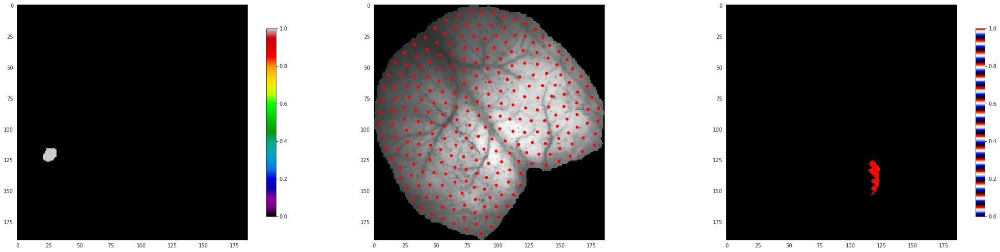

In [158]:
plt.figure(figsize=(30, 7))
plt.subplot(131)
plt.imshow(load['atlas_kmeans'] == 190, cmap='nipy_spectral', interpolation='none')
plt.colorbar(shrink=0.8)

plt.subplot(132)
plt.imshow(load['ref'], cmap='Greys_r', interpolation='none')
for j, i in load['kmeans_centers']: 
    plt.plot(i, j, marker='o', color='r', markersize=5)
    
plt.subplot(133)
plt.imshow(load['atlas'] == 655, cmap='flag_r', interpolation='none')
plt.colorbar(shrink=0.8)

plt.tight_layout()
# plt.savefig('kmeans_atlas.png', dpi=300)
plt.show()

In [162]:
((load['mask'] == 1).astype(int) - (load['atlas_kmeans'] > 0)).sum()

0

In [171]:
((load['mask'] == 1).astype(int) - (load['atlas'] == 0)).sum()

11880

In [172]:
inconsistent_pixels = np.where(np.logical_and(load['mask'] == 1, load['atlas'] == 0))
inconsistent_pixels

(array([100, 106, 107, 108, 108, 109, 109, 109, 109, 110, 110, 110, 110,
        110, 111, 111, 111, 111, 111, 111, 111, 112, 112, 112, 112, 112,
        112, 112, 112, 112, 113, 113, 113, 113, 113, 113, 113, 113, 113,
        114, 114, 114, 114, 114, 114, 114, 114, 114, 114, 115, 115, 115,
        115, 115, 115, 115, 115, 115, 115, 116, 116, 116, 116, 116, 116,
        116, 116, 116, 117, 117, 117, 117, 117, 117, 117, 117, 118, 118,
        118, 118, 118, 119, 119, 119, 120, 135, 137, 138, 138, 139, 139,
        139, 140, 140, 140, 141, 141, 141, 142, 142, 142, 142, 143, 143,
        143, 143, 143, 144, 144, 144, 144, 145, 145, 146, 148, 149, 150,
        153, 154, 154, 155, 155, 156, 156, 156, 157, 157, 158, 158, 159,
        159, 159, 160, 160, 160, 161, 161, 161, 162, 162, 162, 163, 163,
        163, 164, 164, 165, 165, 166, 166, 166, 167, 167, 167, 168, 168,
        168, 169, 169, 169, 170, 171, 171, 171, 171, 172, 172, 172, 172,
        172, 173, 173, 173, 173, 173, 173, 174, 174

In [173]:
load['atlas'][inconsistent_pixels]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0])

In [174]:
load['mask'][inconsistent_pixels]

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [99]:
pixels

(array([179, 180, 180, 180, 181, 181, 181, 181, 181, 181, 182, 182, 182,
        182, 182, 182, 182, 182, 182, 183, 183, 183, 183, 183, 183, 183,
        183, 183, 183, 183, 184, 184, 184, 184, 184, 184, 184, 184, 184,
        184, 184, 184, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185,
        185, 185, 185, 186, 186, 186, 186, 186, 186, 186, 186, 186, 186,
        186, 187, 187, 187, 187, 187, 187, 187, 187, 188, 188, 188, 188,
        188, 188, 189, 189, 189]),
 array([88, 86, 87, 88, 84, 85, 86, 87, 88, 89, 82, 83, 84, 85, 86, 87, 88,
        89, 90, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 80, 81, 82, 83,
        84, 85, 86, 87, 88, 89, 90, 91, 80, 81, 82, 83, 84, 85, 86, 87, 88,
        89, 90, 91, 92, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 83, 84,
        85, 86, 87, 88, 89, 90, 84, 85, 86, 87, 88, 89, 86, 87, 88]))

In [94]:
config.labels

{1: 'R-Frontal pole, cerebral cortex (FRP,184)',
 2: 'R-Primary motor area (MOp,985)',
 3: 'R-Secondary motor area (MOs,993)',
 4: 'R-Primary somatosensory area, nose (SSp-n,353)',
 5: 'R-Primary somatosensory area, barrel field (SSp-bfd,329)',
 6: 'R-Primary somatosensory area, lower limb (SSp-ll,337)',
 7: 'R-Primary somatosensory area, mouth (SSp-m,345)',
 8: 'R-Primary somatosensory area, upper limb (SSp-ul,369)',
 9: 'R-Primary somatosensory area, trunk (SSp-tr,361)',
 10: 'R-Primary somatosensory area, unassigned (SSp-un,182305689)',
 11: 'R-Supplemental somatosensory area (SSs,378)',
 12: 'R-Gustatory areas (GU,1057)',
 13: 'R-Visceral area (VISC,677)',
 14: 'R-Dorsal auditory area (AUDd,1011)',
 15: 'R-Primary auditory area (AUDp,1002)',
 16: 'R-Posterior auditory area (AUDpo,1027)',
 17: 'R-Ventral auditory area (AUDv,1018)',
 18: 'R-Anterolateral visual area (VISal,402)',
 19: 'R-Anteromedial visual area (VISam,394)',
 20: 'R-Lateral visual area (VISl,409)',
 21: 'R-Primary v

### Finer scale

In [28]:
data_all = {}
for run in [1, 3, 5, 7]:
    data_all[run] = load_organized_data(
        folder='atlas-2048_unfiltered_unnormalized',#'filtered_low-0.001_high-4.000_ord-2_normalized',
        config=config,
        subject=6,
        session=1,
        run=run,
    )

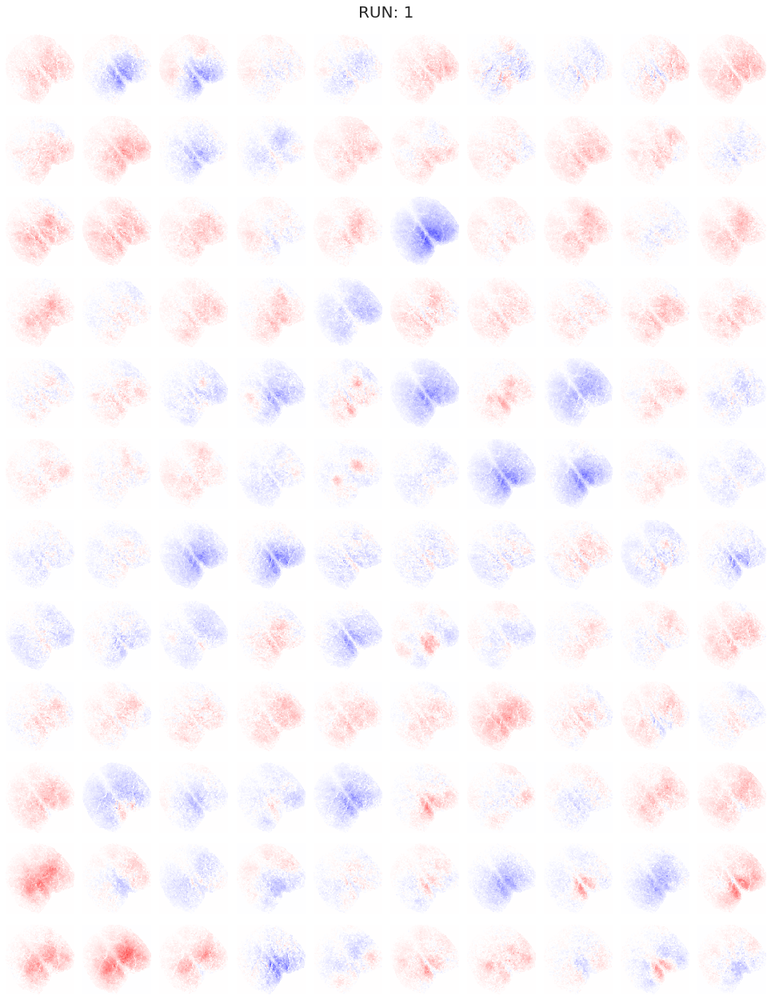

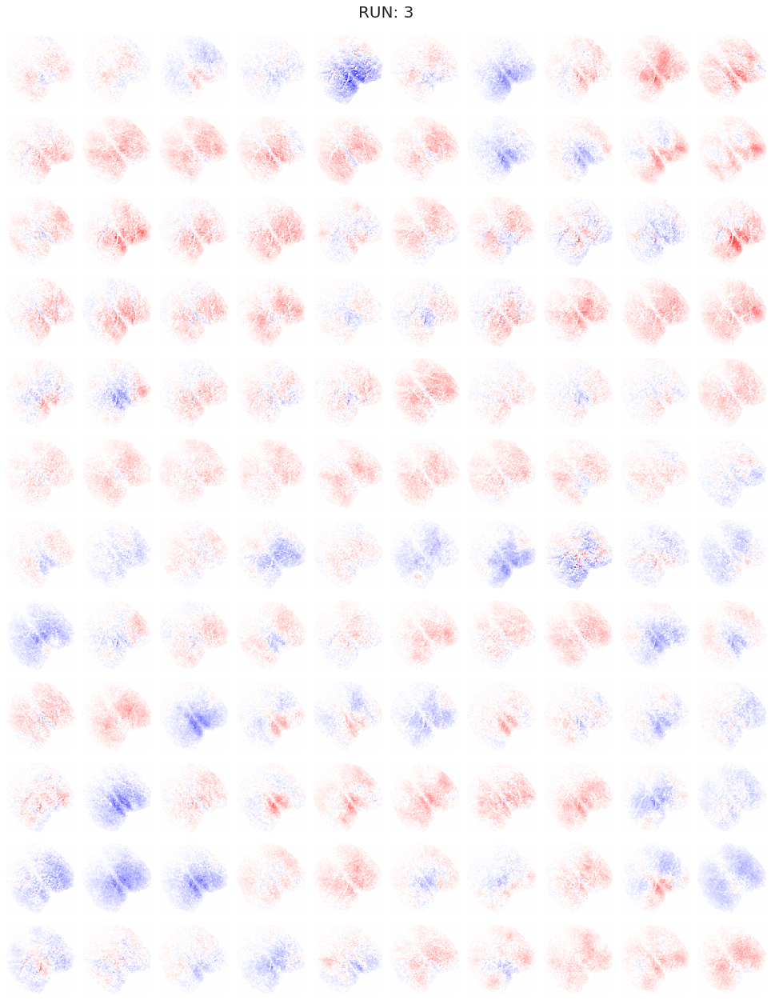

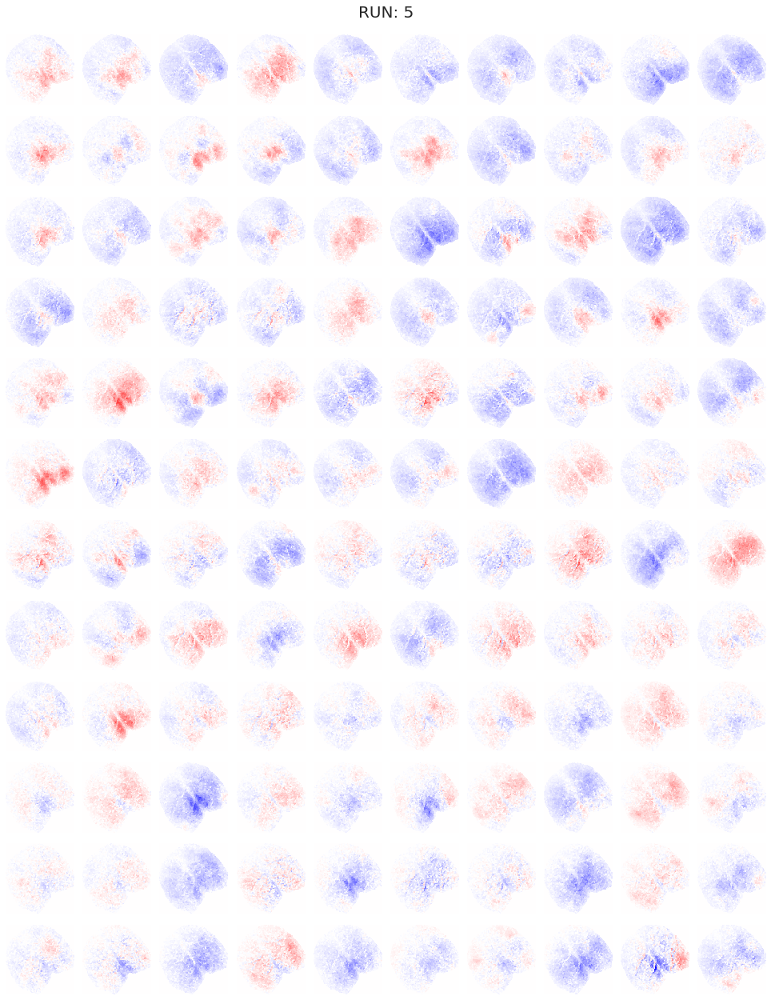

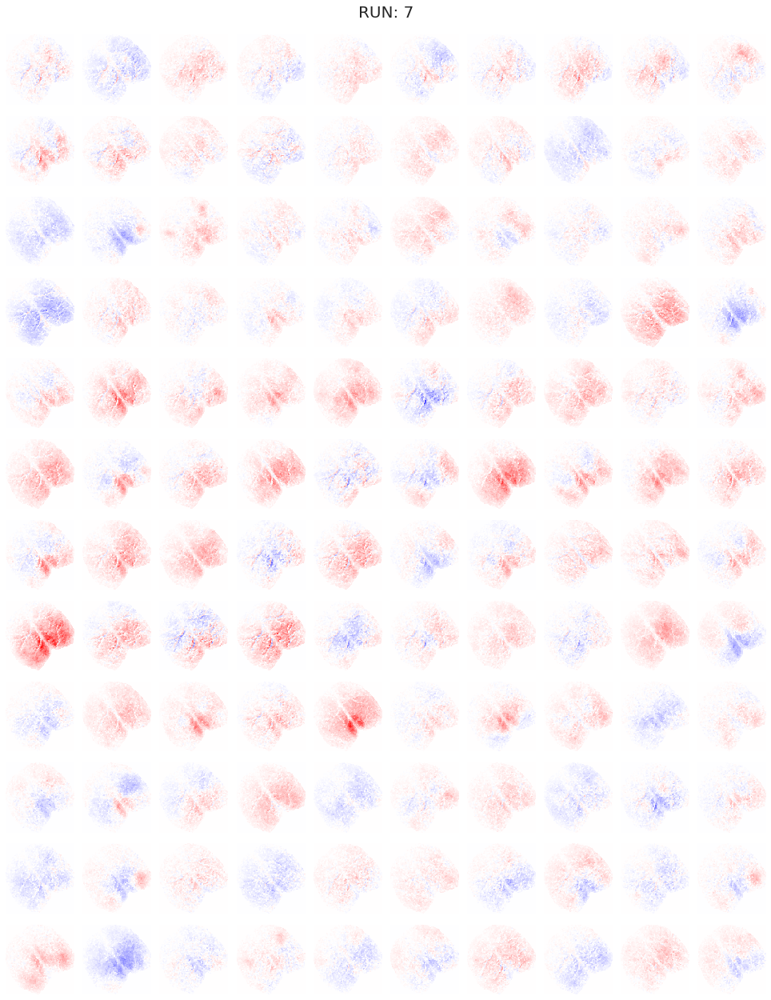

In [29]:
for run in [1, 3, 5, 7]:
    x = np.zeros(data_all[run]['atlas_kmeans'].shape + (list(data_all[run]['ca'].values())[0].shape[-1],))

    for key, time_series in data_all[run]['ca'].items():
        num_nan = np.isnan(time_series).sum()
        if num_nan > 0:
            print(key, num_nan)
            continue

        x[data_all[run]['atlas_kmeans'] == key] = data_all[run]['ca'][key]
    
    t = 1800
    res = 10

    _slice = x[..., t: t + res * 120]
    vminmax = np.max(np.abs(_slice))

    sns.set_style('white')
    nrows, ncols = 12, 10
    fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 17))

    for idx in range(_slice.shape[-1] // res):
        i, j = idx//ncols, idx%ncols
        axes[i, j].imshow(_slice[..., idx * res], vmin=-vminmax, vmax=vminmax, cmap='bwr', interpolation='none')
        axes[i, j].axis('off')

    fig.tight_layout()
    fig.suptitle('RUN: {:d}'.format(run), fontsize=20, y=1.02)
    plt.show()
    
    print('\n\n')

In [31]:
df = pd.DataFrame()

for run, load in data_all.items():
    _df = pd.DataFrame.from_dict(data_all[run]['ca'])
    print(run)
    print(_df.describe().loc[['mean','std']].mean(1))
    print('\n\n')
    df = pd.concat([df, _df])

node_labels = df.columns.values.tolist()
node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

df.describe()

1
mean    18.729764
std     94.845306
dtype: float64



3
mean    -4.891482
std     69.669818
dtype: float64



5
mean     1.756480
std     83.384296
dtype: float64



7
mean     2.402372
std     67.622433
dtype: float64





,1,2,3,4,5,6,7,8,9,10,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,2048
count,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,...,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000
mean,2.539600,2.492350,2.402239,2.454531,2.459049,2.404069,2.464216,2.498584,2.448209,2.661953,...,2.486342,2.648399,2.226385,3.090426,3.118287,3.467110,2.769338,3.547502,3.450560,3.686031
std,21.071502,21.204419,21.854102,23.874212,22.498945,20.225628,21.738131,24.914106,24.296303,24.568039,...,35.609023,35.577926,35.091944,30.230269,31.308877,32.673118,29.448787,27.927970,27.071712,27.213138
min,-81.164087,-77.025150,-81.385529,-80.835804,-79.285951,-69.821959,-72.667626,-91.017195,-93.195370,-93.439453,...,-140.849974,-129.244875,-153.813993,-102.539254,-112.790723,-113.327305,-119.016298,-104.273515,-91.550085,-87.709121
25%,-11.604598,-11.684879,-12.269345,-13.818012,-12.727596,-11.154096,-12.128446,-14.345256,-13.916741,-13.730839,...,-21.251384,-21.031502,-21.487150,-16.989568,-17.887082,-18.712641,-16.996166,-15.117875,-14.789124,-14.466057
50%,2.135894,2.310709,2.156601,1.852993,2.287265,1.914692,2.131674,2.090989,2.212126,2.065520,...,1.208709,0.643312,1.008846,2.009102,1.852542,1.593085,1.495724,2.515808,1.911372,2.174827
75%,16.161393,16.123364,16.597939,17.762278,17.255288,15.379847,16.452061,18.522957,18.290226,18.506764,...,24.823580,24.342867,24.836976,22.336606,22.875130,23.848172,21.132989,21.277934,20.259388,20.343965
max,103.121706,94.835361,93.820520,114.802198,120.430579,92.793580,105.466415,117.265454,116.200744,111.067106,...,212.469960,200.734613,213.529444,181.323752,179.041833,169.631887,222.316534,165.333862,187.587778,169.166023


In [32]:
thresholds = [0.6, 0.7, 0.75, 0.8, 0.85]
corrs = get_corrs(df, thresholds=thresholds)

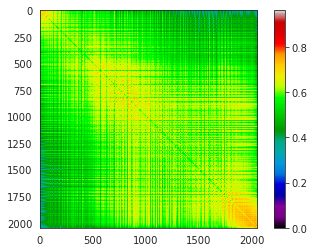

In [33]:
plt.imshow(corrs['pearson_corr'], cmap='nipy_spectral')
plt.colorbar()

In [91]:
from importlib import reload
from utils import plotting
reload(plotting)

from utils.plotting import *

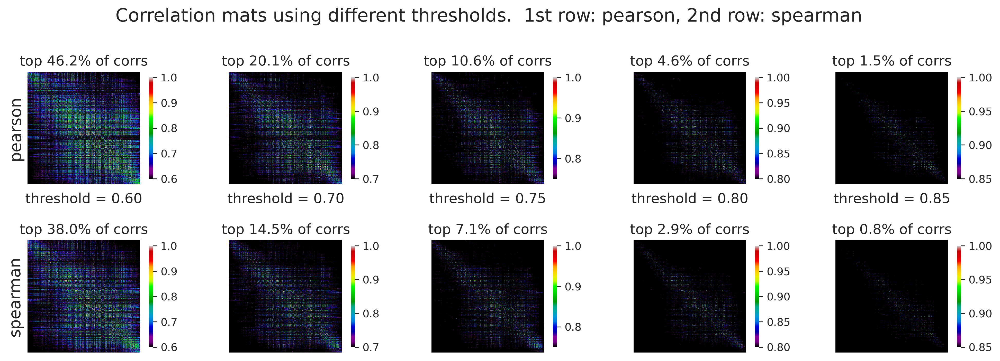

In [92]:
fig, axes = plot_corrs(corrs['pearson'], corrs['spearman'], dpi=300)

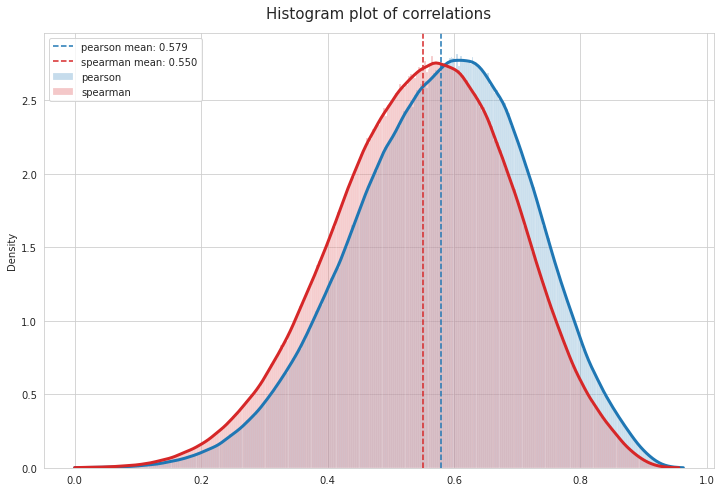

In [93]:
plot_corr_hist(
    corr_list=[corrs['pearson_corr'], corrs['spearman_corr']],
    labels=['pearson', 'spearman'],
    colors=['C0', 'C3'],
)

In [94]:
graphs = {th: nx.from_numpy_matrix(a) for th, a in corrs['spearman'].items()}

In [ ]:
results_louvain = run_louvain(graphs[0.7], res=np.logspace(-1, 1, 1001))

  0%|          | 0/1001 [00:00<?, ?it/s]

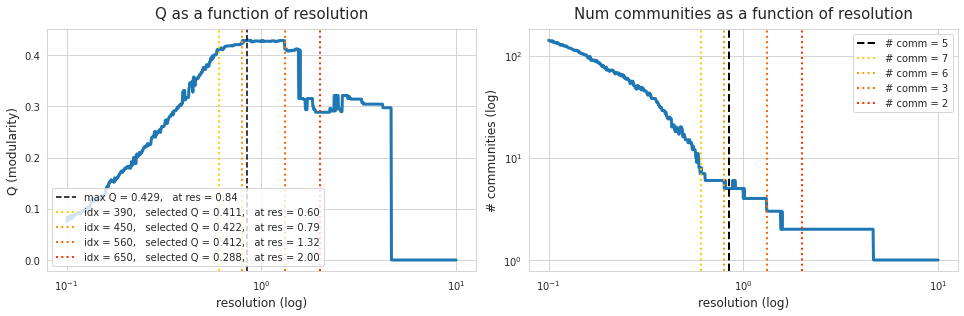

In [400]:
selected_idxs = [390, 450, 560, 650]
plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

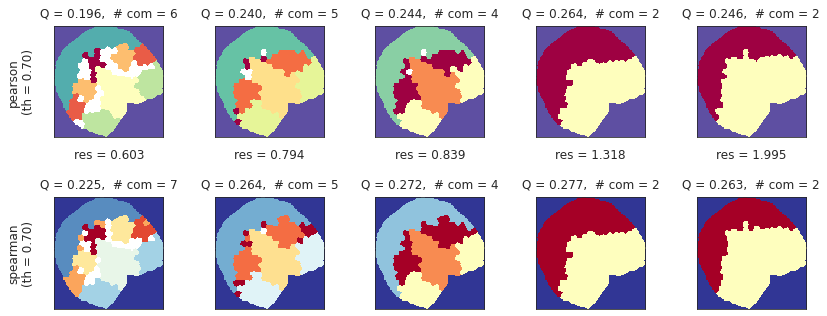

In [402]:
plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    pearson_th=0.7,
    spearman_th=0.7,
    figsize=(12, 4.5),
    colorbar=False, )

### Network measures

In [118]:
field_names = ('subject', 'session', 'run', 'threshold', 'node_labels', 'adjacency', 'graph', 'cfg')

Data = collections.namedtuple(
    typename='Data',
    field_names=field_names,
)

In [119]:
config = Config()
thresholds = [0.70, 0.75, 0.80, 0.85, 0.90]

data_all = {}
for subject in tqdm(range(1, config.num_subjects + 1)):
    for session in tqdm(range(1, config.num_sessions + 1), leave=False):
        for run in range(1, config.num_runs + 1):

            load = load_organized_data(
                folder='unfiltered_normalized',
                config=config,
                subject=subject,
                session=session,
                run=run,
            )
            
            if load is None:
                continue
            
            df = pd.DataFrame.from_dict(load['ca'])
            node_labels = df.columns.values.tolist()
            node_labels = {i: lbl for i, lbl in enumerate(node_labels)}
            corrs = get_corrs(df, thresholds=thresholds)

            key = 'sub-SLC{:02d}'.format(subject)
            key += '_ses-{:d}'.format(session)
            key += '_run-{:d}'.format(run)
            
            for th in thresholds:
                a = corrs['spearman'][th]
                g = nx.from_numpy_matrix(a)
                
                data_all['{:s}_th-{:.2f}'.format(key, th)] = Data(
                    subject=subject,
                    session=session,
                    run=run,
                    threshold=th,
                    node_labels=node_labels,
                    adjacency=a,
                    graph=g,
                    cfg=mk_config_model(g, weighted=True),
                )

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Warning! File not found, moving on . . .
['sub-SLC03', 'ses-1', 'run-1', 'organized', 'ca']



  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Warning! File not found, moving on . . .
['sub-SLC05', 'ses-1', 'run-5', 'organized', 'ca']



  0%|          | 0/3 [00:00<?, ?it/s]

Warning! File not found, moving on . . .
['sub-SLC06', 'ses-3', 'run-2', 'organized', 'ca']



  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Warning! File not found, moving on . . .
['sub-SLC08', 'ses-1', 'run-7', 'organized', 'ca']



  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Warning! File not found, moving on . . .
['sub-SLC10', 'ses-3', 'run-1', 'organized', 'ca']



In [120]:
# network measures
from networkx.algorithms.cluster import transitivity, average_clustering
from networkx.algorithms.assortativity import degree_pearson_correlation_coefficient
from networkx.algorithms.efficiency_measures import global_efficiency, local_efficiency
from networkx.algorithms.approximation.clique import large_clique_size
from networkx.algorithms.shortest_paths.generic import average_shortest_path_length

In [162]:
measures_df = pd.DataFrame()

dict_list = []
for k, data in tqdm(data_all.items()):
    # nodes, degrees = list(zip(*g.degree()))
    
    num_nodes = len(data.node_labels)
    
    # the real graph
    _avg_clustering = average_clustering(data.graph, weight='weight')
    _local_efficiency = local_efficiency(data.graph)
    _large_clique_ratio = large_clique_size(data.graph) / num_nodes
    try:
        _avg_shortest_path_len = average_shortest_path_length(data.graph, weight='weight')
    except:
        _avg_shortest_path_len = np.nan
    _global_efficiency = global_efficiency(data.graph)
    _degree_corr_coef = degree_pearson_correlation_coefficient(data.graph, weight='weight')

    data_dict = {
        'tag': ['real'] * 6,
        'subject': [data.subject] * 6,
        'session': [data.session] * 6,
        'run': [data.run] * 6,
        'threshold': [data.threshold] * 6,
        'num_regions': [num_nodes] * 6,
        'lbl': [
            'avg_clustering',
            'local_efficiency',
            'large_clique_ratio',
            'avg_shortest_path_len',
            'global_efficiency',
            'degree_corr_coef',  # assortativity
        ],
        'val': [
            _avg_clustering,
            _local_efficiency,
            _large_clique_ratio,
            _avg_shortest_path_len,
            _global_efficiency,
            _degree_corr_coef,
        ],
    }
    dict_list.append(data_dict)
    

    # configuration model
    _avg_clustering = average_clustering(data.cfg, weight='weight')
    _local_efficiency = local_efficiency(data.cfg)
    _large_clique_ratio = large_clique_size(data.cfg) / num_nodes
    try:
        _avg_shortest_path_len = average_shortest_path_length(data.cfg, weight='weight')
    except:
        _avg_shortest_path_len = np.nan
    _global_efficiency = global_efficiency(data.cfg)
    _degree_corr_coef = degree_pearson_correlation_coefficient(data.cfg, weight='weight')

    data_dict = {
        'tag': ['cfg'] * 6,
        'subject': [data.subject] * 6,
        'session': [data.session] * 6,
        'run': [data.run] * 6,
        'threshold': [data.threshold] * 6,
        'num_regions': [num_nodes] * 6,
        'lbl': [
            'avg_clustering',
            'local_efficiency',
            'large_clique_ratio',
            'avg_shortest_path_len',
            'global_efficiency',
            'degree_corr_coef',  # assortativity
        ],
        'val': [
            _avg_clustering,
            _local_efficiency,
            _large_clique_ratio,
            _avg_shortest_path_len,
            _global_efficiency,
            _degree_corr_coef,
        ],
    }
    dict_list.append(data_dict)

measures_df = pd.DataFrame.from_dict(merge_dicts(dict_list))

  0%|          | 0/1025 [00:00<?, ?it/s]

...merging dicts: 0it [00:00, ?it/s]

In [163]:
measures_df

,tag,subject,session,run,threshold,num_regions,lbl,val
0,real,1,1,1,0.7,66,avg_clustering,0.609992
1,real,1,1,1,0.7,66,local_efficiency,0.839339
2,real,1,1,1,0.7,66,large_clique_ratio,0.378788
3,real,1,1,1,0.7,66,avg_shortest_path_len,NaN
4,real,1,1,1,0.7,66,global_efficiency,0.699184
...,...,...,...,...,...,...,...,...
12295,cfg,10,3,7,0.9,62,local_efficiency,0.066340
12296,cfg,10,3,7,0.9,62,large_clique_ratio,0.048387
12297,cfg,10,3,7,0.9,62,avg_shortest_path_len,NaN
12298,cfg,10,3,7,0.9,62,global_efficiency,0.207673


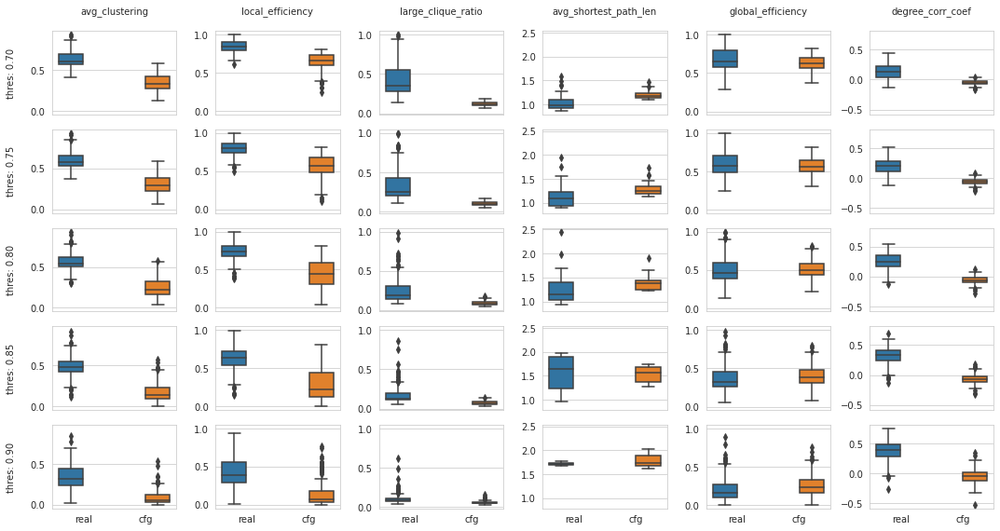

In [164]:
_ths = measures_df.threshold.unique().tolist()
_lbls = measures_df.lbl.unique().tolist()

sns.set_style('whitegrid')
fig, axes = plt.subplots(nrows=len(_ths), ncols=len(_lbls), figsize=(15, 8), sharey='col', sharex='all')

for i, th in enumerate(_ths):
    for j, lbl in enumerate(_lbls):
        selected_df = measures_df.loc[(measures_df.threshold == th) & (measures_df.lbl == lbl)]
        sns.boxplot(data=selected_df, y='val', x='tag', hue='tag', ax=axes[i, j])
        axes[i, j].legend().set_visible(False)
        axes[i, j].set_xlabel('')
        
        if i == 0:
            axes[i, j].set_title('{:s}\n'.format(lbl), fontsize=10)
            
        if j == 0:
            axes[i, j].set_ylabel('thres: {:.2f}\n'.format(th), fontsize=10)
        else:
            axes[i, j].set_ylabel('')

fig.savefig('net_measures.pdf', dpi=200)
fig.tight_layout()
plt.show()

In [ ]:
# TODO: make this general

def plot_louvain_communities(
    graphs: list,
    # pearson: dict,
    # spearman: dict,
    atlas: np.ndarray,
    # modularities: dict,
    # selected_idxs: list,
    # pearson_th: float = 0.7,
    # spearman_th: float = 0.8,
    figsize=(12, 4.5),
    colorbar=False, ):

    # x0, y0 = tuple(zip(*modularities.items()))
    # best_idx = np.argmax(y0)
    # max_mod = y0[best_idx]
    
    sns.set_style('white')
    plot_idxs = sorted(selected_idxs + [best_idx])
    fig, axes = plt.subplots(2, len(plot_idxs), figsize=figsize)

    for ii, idx in enumerate(plot_idxs):
        # g = nx.from_numpy_matrix(spearman[spearman_th])
        coms = cdlib_algorithms.louvain(
            g_original=g,
            weight='weight',
            resolution=best_idx[idx],
            randomize=False,
        )
        partition = convert('community', 'partition', community=coms.communities)
        output = filter_islands(partition, atlas, node_labels, min_com_size=3)
        # comm_mat, comm_dict = filter_islands(partition, labels, scale=size, min_com_size=5)
        q = nx_comm.modularity(g, communities=coms.communities)

        im = axes[0, ii].imshow(output['comm_mat'], cmap='RdYlBu_r', interpolation='none')
        if colorbar:
            plt.colorbar(im, ax=axes[0, ii], shrink=0.7)
        msg = 'res = {:.3f}\n\nQ = {:.3f},  # com = {:d}'
        msg = msg.format(x0[idx], q, len(np.unique(comm_mat[comm_mat>-1])))
        axes[0, ii].set_title(msg, y=1.03)

        g = nx.from_numpy_matrix(pearson[0.8])
        partition = community_louvain.best_partition(g, resolution=x0[idx], random_state=42)
        comm_mat, comm_dict = filter_islands(partition, labels, scale=size, min_com_size=5)
        q = nx_comm.modularity(g, communities=comm_dict.values())

        im = axes[1, ii].imshow(comm_mat, cmap='Spectral_r', interpolation='none')
        if colorbar:
            plt.colorbar(im, ax=axes[1, ii], shrink=0.7)
        msg = 'Q = {:.3f},  # com = {:d}'
        msg = msg.format(q, len(np.unique(comm_mat[comm_mat>-1])))
        axes[1, ii].set_title(msg, y=1.03)

        if ii == 0:
            axes[0, ii].set_ylabel('spearman\n(th = {:.2f})\n'.format(spearman_th), fontsize=12)
            axes[1, ii].set_ylabel('pearson\n(th = {:.2f})\n'.format(pearson_th), fontsize=12)
            
        for j in range(2):
            axes[j, ii].set_xticks([])
            axes[j, ii].set_yticks([])

    fig.tight_layout()
    plt.show()

    return